# P7 SCORING: Exploratory data analysis

In [11]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from fonctions_eda import *
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from contextlib import contextmanager
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import HoverTool, LinearAxis, Range1d, ColumnDataSource, CustomJS, Select
from bokeh.io import output_notebook, show
output_notebook()
import time
import gc
import os
import sys
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

Loading BokehJS ...

This project was made with Python 3.8.8, Matplotlib 3.4.2, Pandas 1.2.4, Numpy 1.20.1, Seaborn 0.11.1. Chek your version number:

In [2]:
print("Python", sys.version_info.major, ".", sys.version_info.minor)
print("Matplotlib", mpl.__version__)
print("Pandas", pd.__version__)
print("Nympy", np.__version__)
print("Seaborn", sns.__version__)

Python 3 . 8
Matplotlib 3.4.2
Pandas 1.2.4
Nympy 1.20.1
Seaborn 0.11.1


The EDA of this notebook is built from several kaggle kernels, modified and re-arranged for this project :
* https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook
* https://www.kaggle.com/gpreda/home-credit-default-risk-extensive-eda
* https://www.kaggle.com/codename007/home-credit-complete-eda-feature-importance

Feature engineering is partly taken from (laso re-arranged):
* https://www.kaggle.com/jsaguiar/lightgbm-with-simple-features/script

NaN/correlations cleaning and PCA is my own work. Modeling, API, dashbord and deployment are also entirely personal work.

In [3]:
# For a better visualisation:
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 400)
pd.set_option('display.float_format', '{:.4f}'.format)
plt.rcParams.update({"figure.titlesize":16, "axes.titlesize":15, "axes.labelsize":14, "xtick.labelsize":14, 
    "ytick.labelsize":14})

## 1. Load dataset

Add the path to the file containing the .csv of the project.

In [4]:
path_to_csv = ""

In [165]:
path_app_train = os.path.join(path_to_csv, "application_train.csv")
path_app_test = os.path.join(path_to_csv, "application_test.csv")
path_bureau = os.path.join(path_to_csv, "bureau.csv")
path_bureau_bal = os.path.join(path_to_csv, "bureau_balance.csv")
path_credit_card = os.path.join(path_to_csv, "credit_card_balance.csv")
path_description = os.path.join(path_to_csv, "HomeCredit_columns_description.csv")
path_installements= os.path.join(path_to_csv, "installments_payments.csv")
path_pos_cash = os.path.join(path_to_csv, "POS_CASH_balance.csv")
path_previous_app = os.path.join(path_to_csv, "previous_application.csv")
path_confusion_cost = os.path.join(path_to_csv, "confusion_costs.png")

In [6]:
app_train = pd.read_csv(path_app_train, encoding="utf-8")
app_test = pd.read_csv(path_app_test, encoding="utf-8")
bureau = pd.read_csv(path_bureau, encoding="utf-8")
bureau_bal = pd.read_csv(path_bureau_bal, encoding="utf-8")
credit_card = pd.read_csv(path_credit_card, encoding="utf-8")
descriptions = pd.read_csv(path_description)
installments = pd.read_csv(path_installements, encoding="utf-8")
pos_cash = pd.read_csv(path_pos_cash, encoding="utf-8")
previous_app = pd.read_csv(path_previous_app, encoding="utf-8")

## 2. Basic info & overview

The data is provided by [Home Credit](http://www.homecredit.net/about-us.aspx), a service dedicated to provided lines of credit (loans) to the unbanked population. Predicting whether or not a client will repay a loan or have difficulty is a critical business need, and Home Credit is hosting this competition on Kaggle to see what sort of models the machine learning community can develop to help them in this task. 

There are 7 different sources of data:

* application_train/application_test: the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature `SK_ID_CURR`. The training application data comes with the `TARGET` indicating 0: the loan was repaid or 1: the loan was not repaid. 
* bureau: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* bureau_balance: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length. 
* previous_application: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature `SK_ID_PREV`. 
* POS_CASH_BALANCE: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* installments_payment: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment. 

This diagram shows how all of the data is related:

![image](https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png)

In [8]:
df_list = [app_test, app_train, bureau, bureau_bal, credit_card, installments, pos_cash, previous_app]
df_names_list = ["Application test", "Application train", "Bureau", "Bureau balance", "Credit card balance",
     "Installements payments", "POS CASH balance", "Previous application"]
subsets_list = ["SK_ID_CURR", "SK_ID_CURR", "SK_ID_CURR", "SK_ID_BUREAU", "SK_ID_PREV", "SK_ID_PREV", 
    "SK_ID_PREV", "SK_ID_CURR"]

In [9]:
info_data_multi(df_list, df_names_list, subsets_list)

,nb lines,nb columns,size,nb duplicates,subsets for duplicates
Application test,48744,121,5898024,0,SK_ID_CURR
Application train,307511,122,37516342,0,SK_ID_CURR
Bureau,1716428,17,29179276,1410617,SK_ID_CURR
Bureau balance,27299925,3,81899775,26482530,SK_ID_BUREAU
Credit card balance,3840312,23,88327176,3736005,SK_ID_PREV
Installements payments,13605401,8,108843208,12607649,SK_ID_PREV
POS CASH balance,10001358,8,80010864,9065033,SK_ID_PREV
Previous application,1670214,37,61797918,1331357,SK_ID_CURR


### 2.1. Descriptions

In [10]:
descriptions.head()

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


### 2.2. Application train and test

In [11]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0000,406597.5000,24700.5000,351000.0000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0188,-9461,-637,-3648.0000,-2120,NaN,1,1,0,1,1,0,Laborers,1.0000,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.0830,0.2629,0.1394,0.0247,0.0369,0.9722,0.6192,0.0143,0.0000,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0000,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.0000,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0000,2.0000,2.0000,2.0000,-1134.0000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
1,100003,0,Cash loans,F,N,N,0,270000.0000,1293502.5000,35698.5000,1129500.0000,Family,State servant,Higher education,Married,House / apartment,0.0035,-16765,-1188,-1186.0000,-291,NaN,1,1,0,1,1,0,Core staff,2.0000,1,1,MONDAY,11,0,0,0,0,0,0,School,0.3113,0.6222,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.0800,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0000,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.0800,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0000,0.0000,1.0000,0.0000,-828.0000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0000,135000.0000,6750.0000,135000.0000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0100,-19046,-225,-4260.0000,-2531,26.0000,1,1,1,1,1,0,Laborers,1.0000,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.5559,0.

In [12]:
app_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0000,568800.0000,20560.5000,450000.0000,Unaccompanied,Working,Higher education,Married,House / apartment,0.0188,-19241,-2329,-5170.0000,-812,NaN,1,1,0,1,0,1,NaN,2.0000,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.7526,0.7897,0.1595,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0000,0.0000,0.0000,0.0000,-1740.0000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,100005,Cash loans,M,N,Y,0,99000.0000,222768.0000,17370.0000,180000.0000,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.0358,-18064,-4469,-9118.0000,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0000,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.5650,0.2917,0.4330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,0.0000,0.0000,0.0000,0.0000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000
2,100013,Cash loans,M,Y,Y,0,202500.0000,663264.0000,69777.0000,630000.0000,NaN,Working,Higher education,Married,House / apartment,0.0191,-20038,-4458,-2175.0000,-3503,5.0000,1,1,0,1,0,0,Drivers,2.0000,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.6998,0.6110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,0.0000,0.0000,0.0000,-856.0000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,1

In [13]:
app_train.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3',

In [37]:
app_train["AMT_CREDIT"].median()*2/100

10270.62

In [14]:
nan_col(app_train)

,% NaN,% dispo
SK_ID_CURR,0.0000,100.0000
TARGET,0.0000,100.0000
NAME_CONTRACT_TYPE,0.0000,100.0000
CODE_GENDER,0.0000,100.0000
FLAG_OWN_CAR,0.0000,100.0000
FLAG_OWN_REALTY,0.0000,100.0000
CNT_CHILDREN,0.0000,100.0000
AMT_INCOME_TOTAL,0.0000,100.0000
AMT_CREDIT,0.0000,100.0000
AMT_ANNUITY,0.0039,99.9961


In [15]:
nan_col(app_test)

,% NaN,% dispo
SK_ID_CURR,0.0000,100.0000
NAME_CONTRACT_TYPE,0.0000,100.0000
CODE_GENDER,0.0000,100.0000
FLAG_OWN_CAR,0.0000,100.0000
FLAG_OWN_REALTY,0.0000,100.0000
CNT_CHILDREN,0.0000,100.0000
AMT_INCOME_TOTAL,0.0000,100.0000
AMT_CREDIT,0.0000,100.0000
AMT_ANNUITY,0.0492,99.9508
AMT_GOODS_PRICE,0.0000,100.0000


### 2.3. Bureau

In [16]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0000,-153.0000,NaN,0,91323.0000,0.0000,NaN,0.0000,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0000,NaN,NaN,0,225000.0000,171342.0000,NaN,0.0000,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0000,NaN,NaN,0,464323.5000,NaN,NaN,0.0000,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0000,NaN,NaN,0.0000,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0000,NaN,77674.5000,0,2700000.0000,NaN,NaN,0.0000,Consumer credit,-21,NaN


In [17]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [18]:
nan_col(bureau)

,% NaN,% dispo
SK_ID_CURR,0.0000,100.0000
SK_ID_BUREAU,0.0000,100.0000
CREDIT_ACTIVE,0.0000,100.0000
CREDIT_CURRENCY,0.0000,100.0000
DAYS_CREDIT,0.0000,100.0000
CREDIT_DAY_OVERDUE,0.0000,100.0000
DAYS_CREDIT_ENDDATE,6.1496,93.8504
DAYS_ENDDATE_FACT,36.9170,63.0830
AMT_CREDIT_MAX_OVERDUE,65.5133,34.4867
CNT_CREDIT_PROLONG,0.0000,100.0000


### 2.4. Bureau balance

In [19]:
bureau_bal.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [20]:
bureau_bal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [21]:
nan_col(bureau_bal)

,% NaN,% dispo
SK_ID_BUREAU,0.0000,100.0000
MONTHS_BALANCE,0.0000,100.0000
STATUS,0.0000,100.0000


### 2.5. POS CASH balance

In [22]:
pos_cash.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0000,45.0000,Active,0,0
1,1715348,367990,-33,36.0000,35.0000,Active,0,0
2,1784872,397406,-32,12.0000,9.0000,Active,0,0
3,1903291,269225,-35,48.0000,42.0000,Active,0,0
4,2341044,334279,-35,36.0000,35.0000,Active,0,0


In [23]:
pos_cash.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [24]:
nan_col(pos_cash)

,% NaN,% dispo
SK_ID_PREV,0.0000,100.0000
SK_ID_CURR,0.0000,100.0000
MONTHS_BALANCE,0.0000,100.0000
CNT_INSTALMENT,0.2607,99.7393
CNT_INSTALMENT_FUTURE,0.2608,99.7392
NAME_CONTRACT_STATUS,0.0000,100.0000
SK_DPD,0.0000,100.0000
SK_DPD_DEF,0.0000,100.0000


### 2.6. Previous application

In [25]:
previous_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.4300,17145.0000,17145.0000,0.0000,17145.0000,SATURDAY,15,Y,1,0.0000,0.1828,0.8673,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0000,middle,POS mobile with interest,365243.0000,-42.0000,300.0000,-42.0000,-37.0000,0.0000
1,2802425,108129,Cash loans,25188.6150,607500.0000,679671.0000,NaN,607500.0000,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0000,low_action,Cash X-Sell: low,365243.0000,-134.0000,916.0000,365243.0000,365243.0000,1.0000
2,2523466,122040,Cash loans,15060.7350,112500.0000,136444.5000,NaN,112500.0000,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0000,high,Cash X-Sell: high,365243.0000,-271.0000,59.0000,365243.0000,365243.0000,1.0000
3,2819243,176158,Cash loans,47041.3350,450000.0000,470790.0000,NaN,450000.0000,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0000,middle,Cash X-Sell: middle,365243.0000,-482.0000,-152.0000,-182.0000,-177.0000,1.0000
4,1784265,202054,Cash loans,31924.3950,337500.0000,404055.0000,NaN,337500.0000,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0000,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
previous_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [27]:
nan_col(previous_app)

,% NaN,% dispo
SK_ID_PREV,0.0000,100.0000
SK_ID_CURR,0.0000,100.0000
NAME_CONTRACT_TYPE,0.0000,100.0000
AMT_ANNUITY,22.2867,77.7133
AMT_APPLICATION,0.0000,100.0000
AMT_CREDIT,0.0001,99.9999
AMT_DOWN_PAYMENT,53.6365,46.3635
AMT_GOODS_PRICE,23.0818,76.9182
WEEKDAY_APPR_PROCESS_START,0.0000,100.0000
HOUR_APPR_PROCESS_START,0.0000,100.0000


### 2.7. Installments payments

In [28]:
installments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0000,6,-1180.0000,-1187.0000,6948.3600,6948.3600
1,1330831,151639,0.0000,34,-2156.0000,-2156.0000,1716.5250,1716.5250
2,2085231,193053,2.0000,1,-63.0000,-63.0000,25425.0000,25425.0000
3,2452527,199697,1.0000,3,-2418.0000,-2426.0000,24350.1300,24350.1300
4,2714724,167756,1.0000,2,-1383.0000,-1366.0000,2165.0400,2160.5850


In [29]:
installments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [30]:
nan_col(installments)

,% NaN,% dispo
SK_ID_PREV,0.0000,100.0000
SK_ID_CURR,0.0000,100.0000
NUM_INSTALMENT_VERSION,0.0000,100.0000
NUM_INSTALMENT_NUMBER,0.0000,100.0000
DAYS_INSTALMENT,0.0000,100.0000
DAYS_ENTRY_PAYMENT,0.0214,99.9786
AMT_INSTALMENT,0.0000,100.0000
AMT_PAYMENT,0.0214,99.9786


### 2.8. Credit card balance

In [31]:
credit_card.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.9700,135000,0.0000,877.5000,0.0000,877.5000,1700.3250,1800.0000,1800.0000,0.0000,0.0000,0.0000,0.0000,1,0.0000,1.0000,35.0000,Active,0,0
1,2582071,363914,-1,63975.5550,45000,2250.0000,2250.0000,0.0000,0.0000,2250.0000,2250.0000,2250.0000,60175.0800,64875.5550,64875.5550,1.0000,1,0.0000,0.0000,69.0000,Active,0,0
2,1740877,371185,-7,31815.2250,450000,0.0000,0.0000,0.0000,0.0000,2250.0000,2250.0000,2250.0000,26926.4250,31460.0850,31460.0850,0.0000,0,0.0000,0.0000,30.0000,Active,0,0
3,1389973,337855,-4,236572.1100,225000,2250.0000,2250.0000,0.0000,0.0000,11795.7600,11925.0000,11925.0000,224949.2850,233048.9700,233048.9700,1.0000,1,0.0000,0.0000,10.0000,Active,0,0
4,1891521,126868,-1,453919.4550,450000,0.0000,11547.0000,0.0000,11547.0000,22924.8900,27000.0000,27000.0000,443044.3950,453919.4550,453919.4550,0.0000,1,0.0000,1.0000,101.0000,Active,0,0


In [32]:
credit_card.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

In [33]:
nan_col(credit_card)

,% NaN,% dispo
SK_ID_PREV,0.0000,100.0000
SK_ID_CURR,0.0000,100.0000
MONTHS_BALANCE,0.0000,100.0000
AMT_BALANCE,0.0000,100.0000
AMT_CREDIT_LIMIT_ACTUAL,0.0000,100.0000
AMT_DRAWINGS_ATM_CURRENT,19.5249,80.4751
AMT_DRAWINGS_CURRENT,0.0000,100.0000
AMT_DRAWINGS_OTHER_CURRENT,19.5249,80.4751
AMT_DRAWINGS_POS_CURRENT,19.5249,80.4751
AMT_INST_MIN_REGULARITY,7.9482,92.0518


### 2.9. Creating datetime columns

For readability, we will convert the days columns into years (floats).

In [34]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0000,406597.5000,24700.5000,351000.0000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0188,-9461,-637,-3648.0000,-2120,NaN,1,1,0,1,1,0,Laborers,1.0000,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.0830,0.2629,0.1394,0.0247,0.0369,0.9722,0.6192,0.0143,0.0000,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0000,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.0000,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0000,2.0000,2.0000,2.0000,-1134.0000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
1,100003,0,Cash loans,F,N,N,0,270000.0000,1293502.5000,35698.5000,1129500.0000,Family,State servant,Higher education,Married,House / apartment,0.0035,-16765,-1188,-1186.0000,-291,NaN,1,1,0,1,1,0,Core staff,2.0000,1,1,MONDAY,11,0,0,0,0,0,0,School,0.3113,0.6222,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.0800,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0000,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.0800,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0000,0.0000,1.0000,0.0000,-828.0000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0000,135000.0000,6750.0000,135000.0000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0100,-19046,-225,-4260.0000,-2531,26.0000,1,1,1,1,1,0,Laborers,1.0000,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.5559,0.

In [35]:
col_dates = app_train[["DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION", "DAYS_ID_PUBLISH"]]

col_dates["DAYS_BIRTH_y"] = col_dates["DAYS_BIRTH"]/365
col_dates["DAYS_EMPLOYED_y"] = col_dates["DAYS_EMPLOYED"]/365
col_dates["DAYS_REGISTRATION_y"] = col_dates["DAYS_REGISTRATION"]/365
col_dates["DAYS_ID_PUBLISH_y"] = col_dates["DAYS_ID_PUBLISH"]/365


<ipython-input-35-f60e774b9aa4>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-35-f60e774b9aa4>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-35-f60e774b9aa4>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-35-f60e774

In [36]:
col_dates

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,DAYS_BIRTH_y,DAYS_EMPLOYED_y,DAYS_REGISTRATION_y,DAYS_ID_PUBLISH_y
0,-9461,-637,-3648.0000,-2120,-25.9205,-1.7452,-9.9945,-5.8082
1,-16765,-1188,-1186.0000,-291,-45.9315,-3.2548,-3.2493,-0.7973
2,-19046,-225,-4260.0000,-2531,-52.1808,-0.6164,-11.6712,-6.9342
3,-19005,-3039,-9833.0000,-2437,-52.0685,-8.3260,-26.9397,-6.6767
4,-19932,-3038,-4311.0000,-3458,-54.6082,-8.3233,-11.8110,-9.4740
...,...,...,...,...,...,...,...,...
307506,-9327,-236,-8456.0000,-1982,-25.5534,-0.6466,-23.1671,-5.4301
307507,-20775,365243,-4388.0000,-4090,-56.9178,1000.6658,-12.0219,-11.2055
307508,-14966,-7921,-6737.0000,-5150,-41.0027,-21.7014,-18.4575,-14.1096
307509,-11961,-4786,-2562.0000,-931,-32.7699,-13.1123,-7.0192,-2.5507


## 3. Target and categorical features distributions

In [64]:
def plot_stats(df, feature, label_rotation=False, horizontal_layout=True, return_df=False):
    """
    """
    temp = df[feature].value_counts()
    data = pd.DataFrame({feature: temp.index,'Number of contracts': temp.values})
    data["Percentage of contracts"] = data["Number of contracts"]*100/(data["Number of contracts"].sum())

    # Calculate the percentage of target=1 per category value
    cat_perc = df[[feature, 'TARGET']].groupby([feature],as_index=False).mean()
    cat_perc["TARGET"] = cat_perc["TARGET"]*100
    
    if(horizontal_layout):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
    else:
        fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12,14))
    
    sns.set_color_codes("pastel")

    s = sns.barplot(ax=ax1, x = feature, y="Percentage of contracts", data=data)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(), rotation=90)
    ax1.set_title(f"Percentage of contracts by \n {feature} category")

    s = sns.barplot(ax=ax2, x = feature, y='TARGET', order=cat_perc[feature], data=cat_perc)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    ax2.set_title('Percentage of non-repaid loans for each category (%)')
    ax2.set_ylabel('% of target with value=1')
    ax2.set_xlabel(feature)

    if return_df:
        return cat_perc

### 3.1. Target distribution

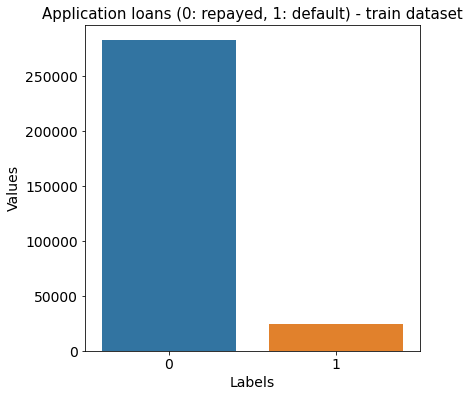

In [65]:
temp = app_train["TARGET"].value_counts()
df = pd.DataFrame({'Labels': temp.index,
                   'Values': temp.values
                  })
plt.figure(figsize = (6,6))
plt.title('Application loans (0: repayed, 1: default) - train dataset')
sns.set_color_codes("pastel")
sns.barplot(x = 'Labels', y="Values", data=df)
locs, labels = plt.xticks()
plt.show()

The largest part of our data is about loans that were repaid (0), and only a small part made defaut (1). We are therefore dealing with very unbalanced data.

### 3.2. Contract type

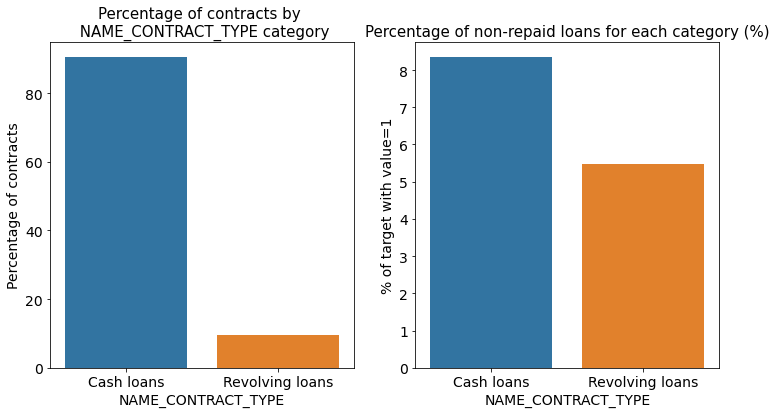

In [42]:
plot_stats(app_train, 'NAME_CONTRACT_TYPE')

Contract type *Revolving loans* are just a small fraction (10%) from the total number of loans; in the same time, a larger amount of *Revolving loans*, comparing with their frequency, are not repaid.

### 3.3. Client gender

Let's see the gender of the clients and also, on a separate plot, the percent of the loans (by client gender) with TARGET value 1 (not returned loan).

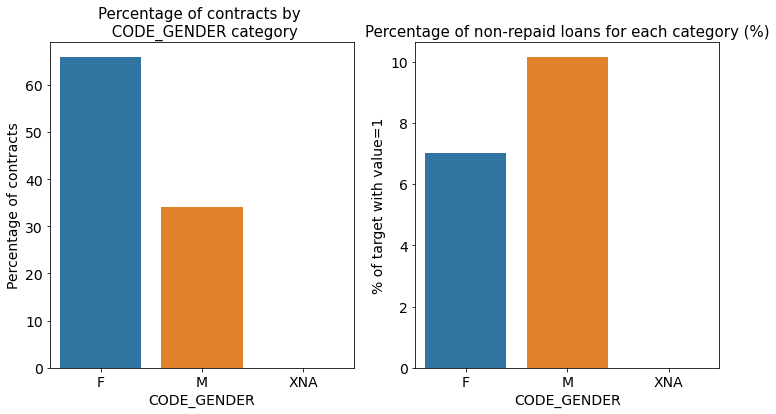

In [43]:
plot_stats(app_train, 'CODE_GENDER')

The number of female clients is almost double  the number of male clients. Looking to the percent of defaulted credits, males have a higher chance of not returning their loans (~10%), comparing with women (~7%).

### 3.4. Flag own car and flag own real estate

Let's inspect the  flags that tell us if a client owns a car or real estate and, on separate plots, the percent of the loans value of these flags) with TARGET value 1 (not returned loan).

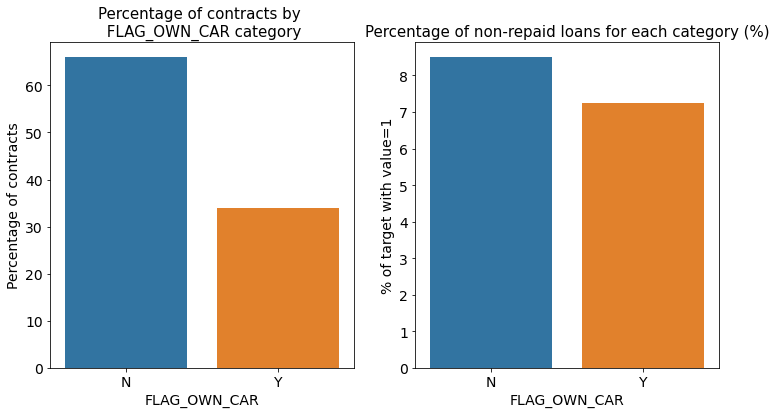

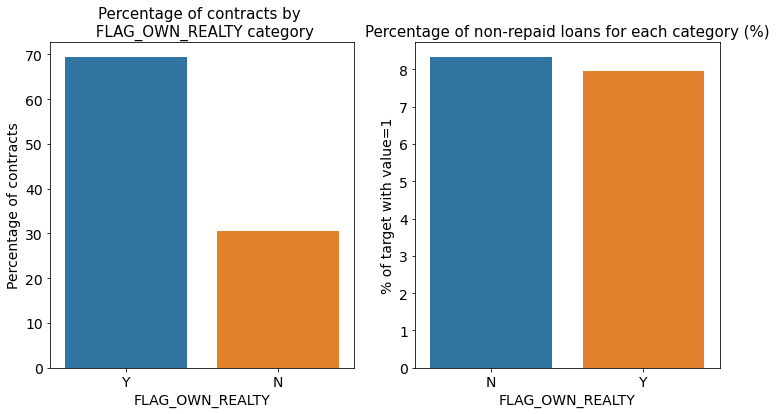

In [44]:
plot_stats(app_train, 'FLAG_OWN_CAR')
plot_stats(app_train, 'FLAG_OWN_REALTY')

The clients that owns a car are almost a half of the ones that doesn't own one. The clients that owns a car are less likely to not repay a car that the ones that own. Both categories have not-repayment rates around 8%.

The clients that owns real estate are more than double of the ones that doesn't own. Both categories (owning real estate or not owning) have not-repayment rates less than 8%.


### 3.5. Family status of client

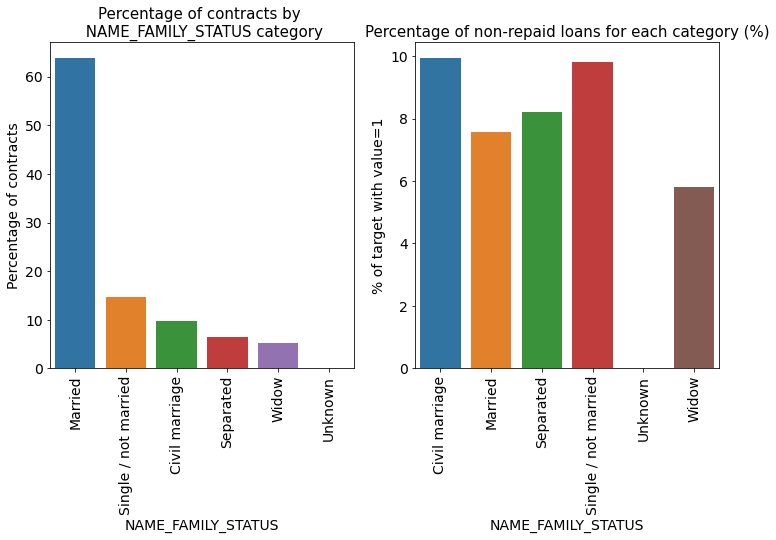

In [45]:
plot_stats(app_train, 'NAME_FAMILY_STATUS',True, True)

Most of clients are married, followed by Single/not married and civil marriage.

In terms of percentage of not repayment of loan, Civil marriage has the highest percent of not repayment (10%), with Widow the lowest (exception being *Unknown*).

### 3.6. Number of children

Let's see what is the distribution of the number of children of the clients.

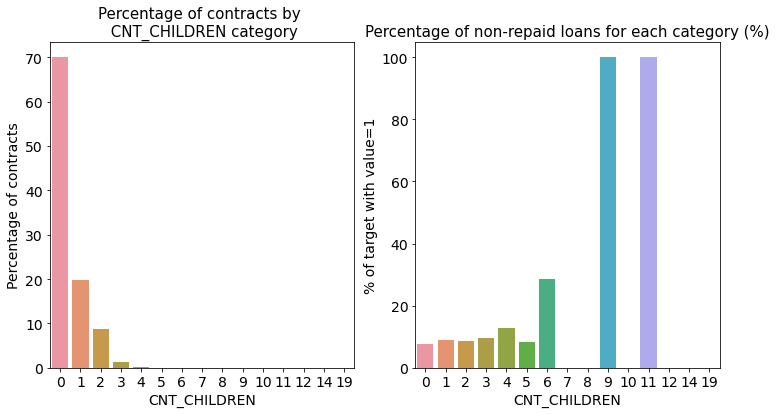

In [46]:
plot_stats(app_train, 'CNT_CHILDREN')

Most of the clients taking a loan have no children. The number of loans associated with the clients with one children are 4 times smaller, the number of loans associated with the clients with two children are 8 times smaller; clients with 3, 4 or more children are much more rare. 

As for repayment, clients with no children, 1, 2, 3, and 5 children have percents of no repayment around the average (10%). The clients with 4 and 6 children are above average in terms of percent of not paid back loans (over 25% for families with 6 children).

As for clients with 9 or 11 children, the percent of loans not repaid is 100%.



### 3.7. Number of family members of client

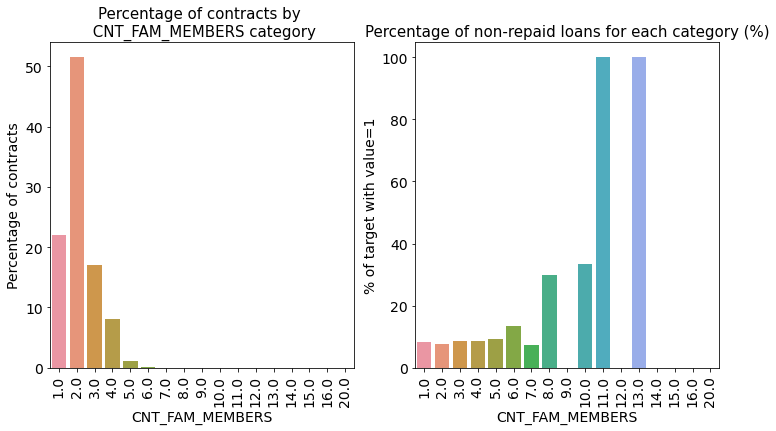

In [47]:
plot_stats(app_train, 'CNT_FAM_MEMBERS',True)

Clients with family members of 2 are most numerous, followed by 1 (single persons), 3 (families with one child) and 4.

Clients with family size of 11 and 13 have 100% not repayment rate. Other families with 10 or 8 members have percents of not repayment of loans over 30%. Families with 6 or less members have repayment rates close to the 10% average.


### 3.8. Income type of client

Let's investigate the numbers of clients with different income type. As well, let's see the percent of not returned loans per income type of applicants.

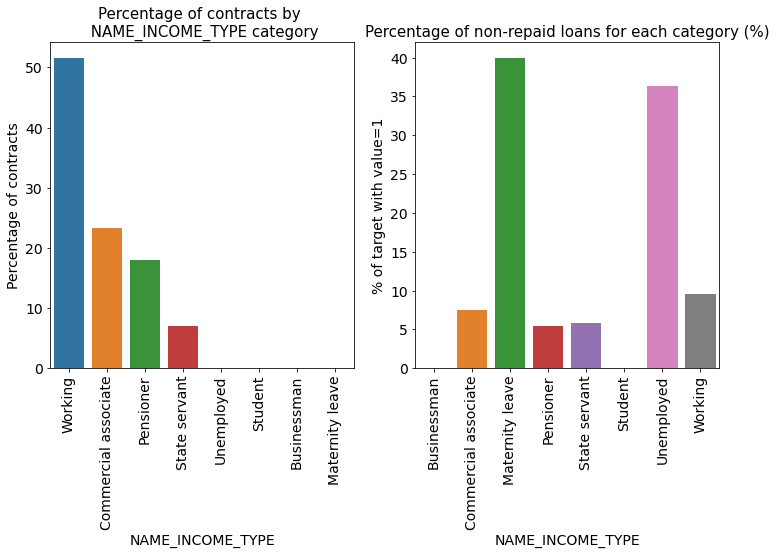

In [48]:
plot_stats(app_train, 'NAME_INCOME_TYPE', True, True)

Most of applicants for loans are income from *Working*, followed by *Commercial associate*, *Pensioner* and *State servant*.

The applicants with the type of income *Maternity leave* have almost 40% ratio of not returning loans, followed by *Unemployed* (37%). The rest of types of incomes are under the average of 10% for not returning loans.


### 3.9. Ocupation of client

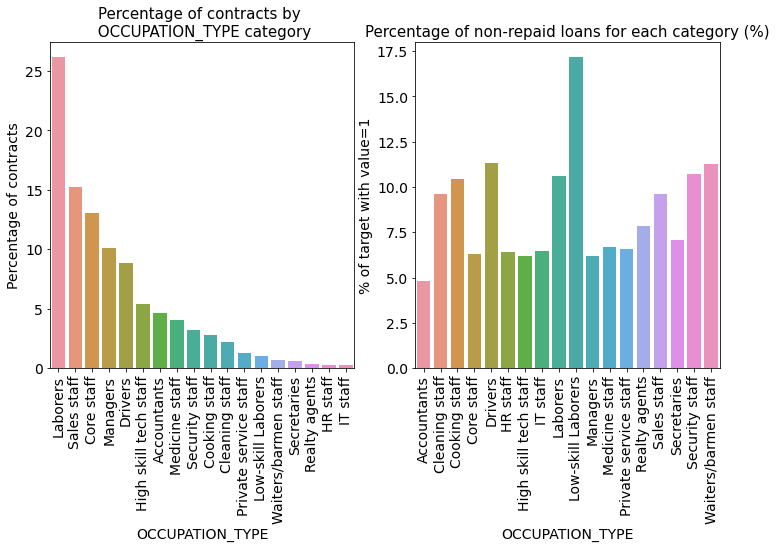

In [49]:
plot_stats(app_train, 'OCCUPATION_TYPE', True, True)

Most of the loans are taken by *Laborers*, followed by *Sales staff*. *IT staff* take the lowest amount of loans.

The category with highest percent of not repaid loans are *Low-skill Laborers* (above 17%), followed by *Drivers* and *Waiters/barmen staff*, *Security staff*, *Laborers* and *Cooking staff*.

### 3.10. Organization type

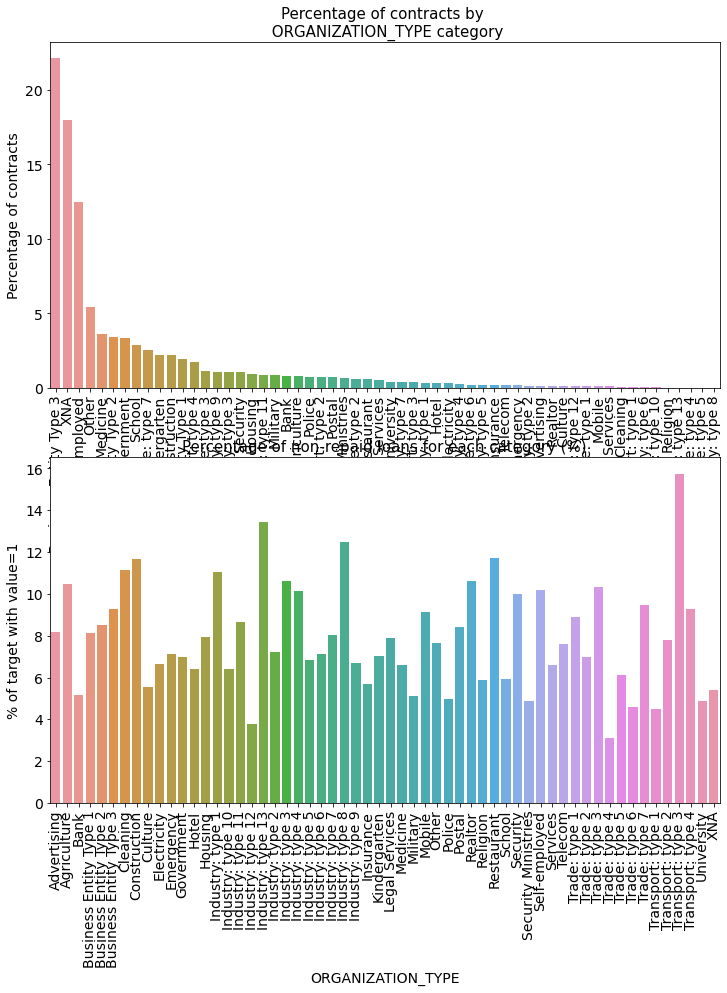

In [50]:
plot_stats(app_train, 'ORGANIZATION_TYPE',True, False)

Oraganizations with highest percent of loans not repaid are *Transport: type 3* (16%), *Industry: type 13* (13.5%), *Industry: type 8* (12.5%) and *Restaurant* (less than 12%).

### 3.11. Education type of the client

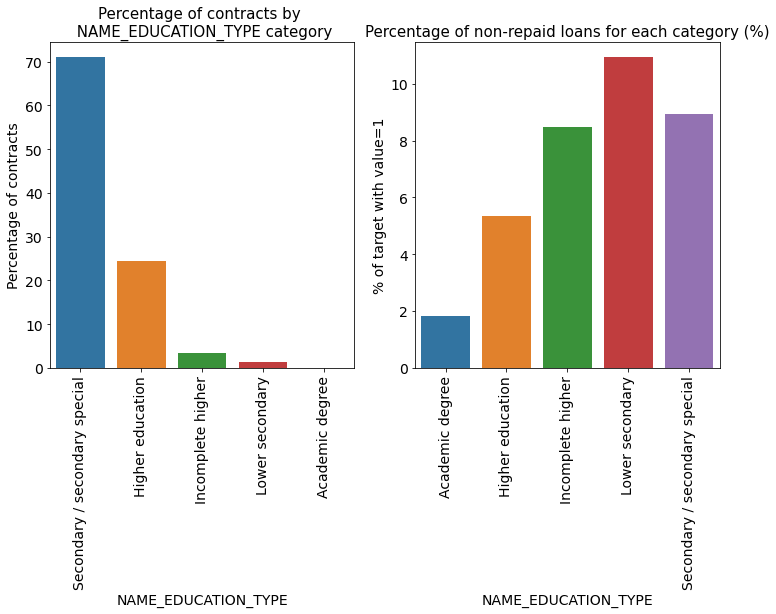

In [51]:
plot_stats(app_train, 'NAME_EDUCATION_TYPE', True)

Majority of the clients have Secondary / secondary special education, followed by clients with Higher education. Only a very small number having an academic degree.

The Lower secondary category, although rare, have the largest rate of not returning the loan (11%). The people with Academic degree have less than 2% not-repayment rate.


### 3.12. Type of the housing of client

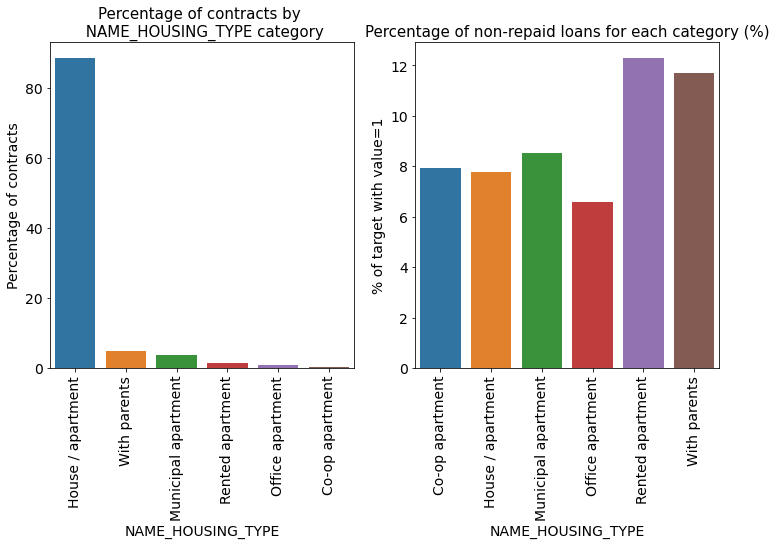

In [52]:
plot_stats(app_train, 'NAME_HOUSING_TYPE', True)

Over 250,000 applicants for credits registered their housing as House/apartment. Following categories have a very small number of clients (With parents, Municipal appartment).

From these categories, *Rented apartment* and *With parents* have higher than 10% not-repayment rate.

### 3.13. Name type suite

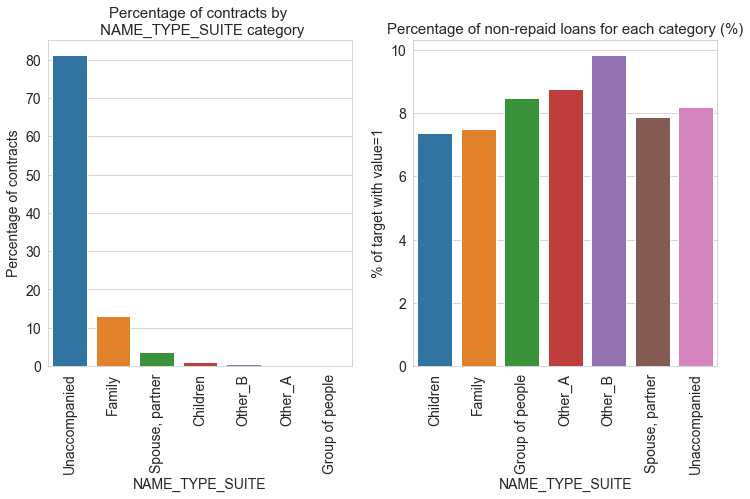

In [238]:
plot_stats(app_train, 'NAME_TYPE_SUITE', True)

## 4. Numerical features distributions

### 4.1. Total income, credit, annuity, goods price distributions

In [52]:
# Plot distribution of one feature
def plot_distribution(df, feature, color, negative=False):
    
    if negative:
        dis = sns.displot(-df[feature].dropna(),color=color, kde=True, bins=100, height=6, aspect=10/6)
    else:
        dis = sns.displot(df[feature].dropna(),color=color, kde=True, bins=100, height=6, aspect=10/6)
    dis.set(title=f"Distribution of {feature}")

In [53]:
# Plot distribution of one feature
def plot_distributions(df, features_list, colors_list):
    
    indices_rows = [0, 0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5]
    indices_col = [0, 1, 0, 1, 0, 1, 0, 1, 0, 1]
    n_vars = len(features_list)
    indices_rows = indices_rows[:n_vars]
    indices_col = indices_col[:n_vars]
    
    n_rows = round(n_vars/2+0.5)
    
    fig, ax = plt.subplots(n_rows, 2, figsize=(11, 5*n_rows), tight_layout=True)

    for row, col, feature, color in zip(indices_rows, indices_col, features_list, colors_list):
        dis = sns.histplot(ax=ax[row, col], x=df[feature].dropna(), color=color, kde=True, bins=100)
        dis.set(title=f"Distribution of {feature}")

In [54]:
# Plot distribution of multiple features, with TARGET = 1/0 on the same graph
def plot_distribution_comp(df, features_list, colors_list):

    n_vars = len(features_list)
    t1 = df.loc[df['TARGET'] != 0]
    t0 = df.loc[df['TARGET'] == 0]

    sns.set_style('whitegrid')
    
    fig, ax = plt.subplots(n_vars, 2, figsize=(10, 4*n_vars), tight_layout=True)

    for n, feature, color in zip(range(len(features_list)), features_list, colors_list):
        sns.kdeplot(ax=ax[n, 0], x=t1[feature], bw_method=0.5, label="TARGET = 1", color=color)
        sns.kdeplot(ax=ax[n, 1], x=t0[feature], bw_method=0.5, label="TARGET = 0", color=color)
        ax[n, 0].set_xlabel(feature)
        ax[n, 1].set_xlabel(feature)
        ax[n, 0].set_ylabel("Density for target=1")
        ax[n, 1].set_ylabel("Density for target=0")

Let's plot the distribution of total income for the clients.

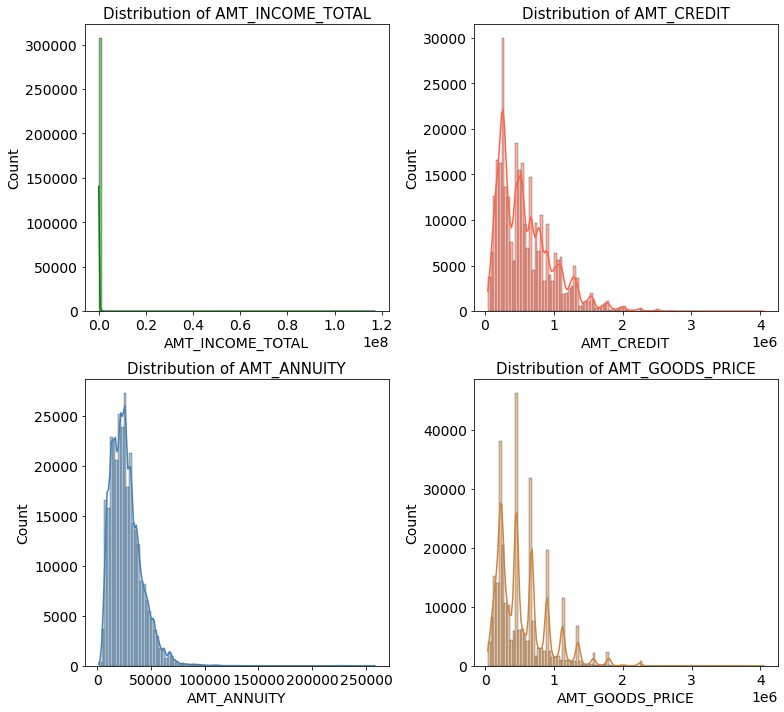

In [56]:
vars_to_plot = ["AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE"]
colors = ["green", "tomato", "steelblue", "peru"]

plot_distributions(app_train, vars_to_plot, colors)

### 4.2. Credit distribution

Let's plot the credit distribution.

In [198]:
test = list(app_train.select_dtypes(include=["float64", "int64"]).columns)
test0 = test[0]

In [199]:
feature = test[0]

select = Select(title="Option:", value=test[0], options=test)
select.js_on_change("value", CustomJS(code="""
    console.log('select: value=' + this.value, this.toString())
"""))


show(select)

In [200]:
#feature = test[0]

#select = Select(title="Option:", value=test[0], options=test)
#select.on_change("value", update)

#show(select)

In [201]:
#def function_to_call("value", old, new):
  #return select.value

In [202]:
#function_to_call(select, old, new)

In [203]:
def make_plot(df, feature):

       density, edges = np.histogram(df[feature], density=True, bins=50)
       hist, _ = np.histogram(df[feature], bins=50)
       kde = stats.gaussian_kde(df[feature])
       data_source = pd.DataFrame({"edges_left": edges[:-1], "edges_right": edges[1:], "density":density, "hist":hist})
       source = ColumnDataSource(data=data_source)

       features = list(df.select_dtypes(include=["float64", "int64"]).columns)

       xmin = df[feature].min()
       xmax = df[feature].max()
       y2min = hist.min()
       y2max = hist.max() + 2000
       x = np.linspace(xmin, xmax, num=200)
       y2 = np.linspace(y2min, y2max, 10)

       p = figure(title=f"Distribution of {feature}", plot_width=700, plot_height=500)
       qr = p.quad(top="density", bottom=0, line_color="white", left="edges_left", right="edges_right",
              fill_color="navy", hover_fill_color="orange", legend_label="50 bins histogram", 
              alpha=0.5, hover_alpha=1, source=source)
       p.line(x, kde(x), line_color="navy", line_width=2, alpha=0.7, legend_label="Probability density function")

       p.y_range.start = 0
       #p.y_range_end = 
       p.extra_y_ranges = {"count": Range1d(start=y2min, end=y2max)} #range_padding ?
       p.legend.location = "top_right"
       p.xaxis.axis_label = feature
       p.yaxis.axis_label = "Density"
       p.grid.grid_line_color="grey"
       p.xgrid.grid_line_color=None
       p.ygrid.grid_line_alpha=0.5
       p.add_tools(HoverTool(tooltips=[("Between:", "@edges_left"), ("and:", "@edges_right"), ("Count:", "@hist")], 
                            renderers = [qr]))
       p.add_layout(LinearAxis(y_range_name="count", axis_label="Count"), "right")
       
       show(p)

In [204]:
make_plot(app_train, "AMT_CREDIT")

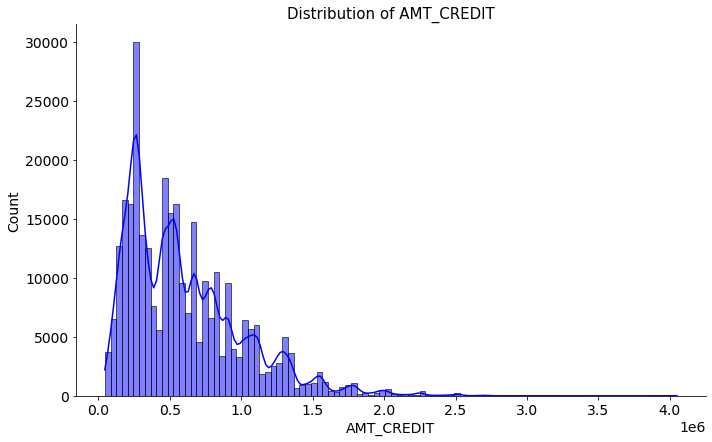

In [57]:
plot_distribution(app_train, 'AMT_CREDIT','blue')

### 4.3. Annuity distribution

Let's plot the annuity distribution.

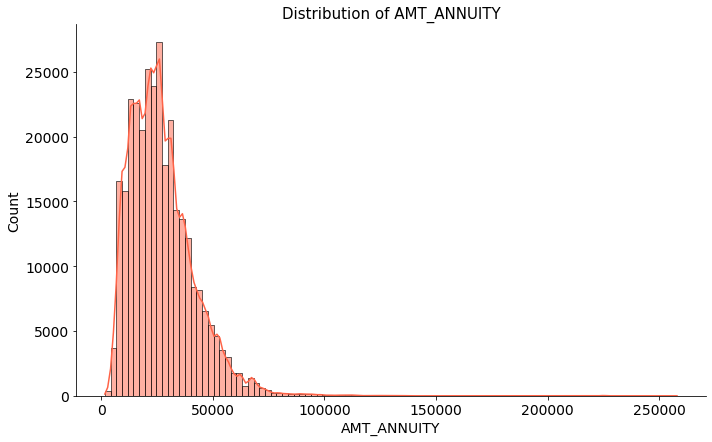

In [58]:
plot_distribution(app_train, 'AMT_ANNUITY','tomato')

### 4.4. Goods price

Let's plot the good price distribution.

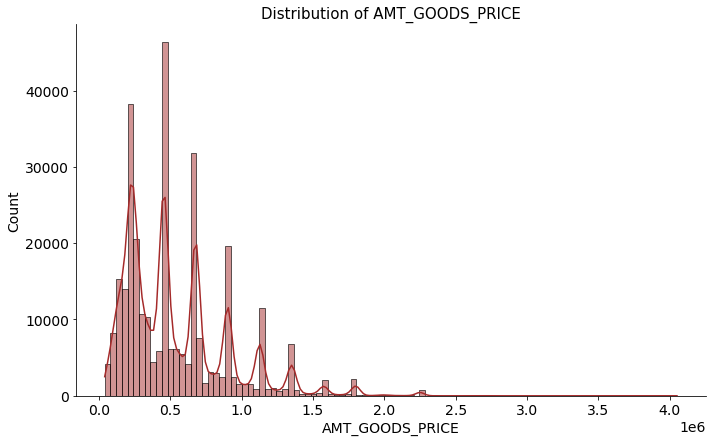

In [59]:
plot_distribution(app_train, 'AMT_GOODS_PRICE','brown')

### 4.5. Days from birth distribution

Let's plot the distribution number of days from birth.

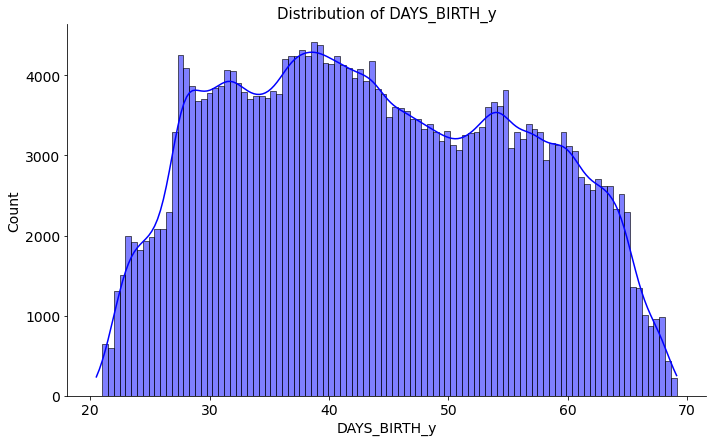

In [60]:
plot_distribution(col_dates, 'DAYS_BIRTH_y','blue', negative=True)

The age range is between approximative 20 and 68 years, with most clients around 40.

### 4.6. Days employed distribution

Let's represent the distribution of number of days employed.

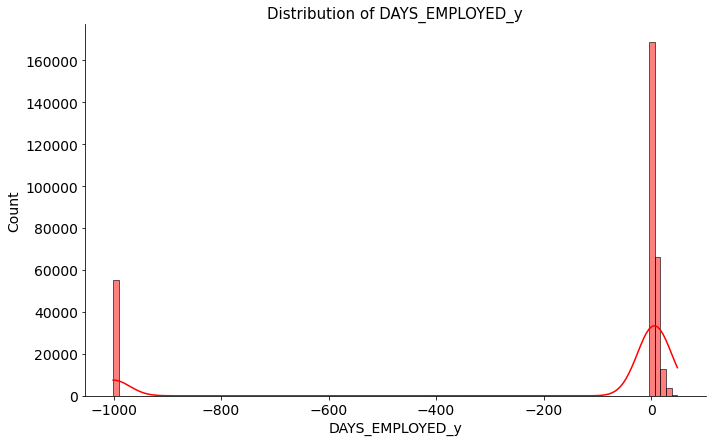

In [61]:
plot_distribution(col_dates, 'DAYS_EMPLOYED_y', 'red', negative=True)

*Days employed* are negative in the original dataset. Values of 1000 (-1000 in the above graph) most probably corresponds to unknown values. We will need to drop those lines.

### 4.7. Days of registration distribution

Let's plot the distribution of `DAYS_REGISTRATION`.

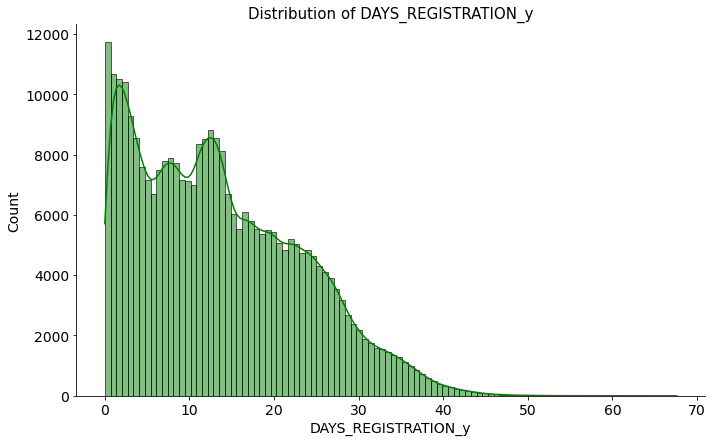

In [62]:
plot_distribution(col_dates, 'DAYS_REGISTRATION_y', 'green', negative=True)

### 4.8. Days ID publish distribution

Let's plot the distribution of DAYS_ID_PUBLISH.

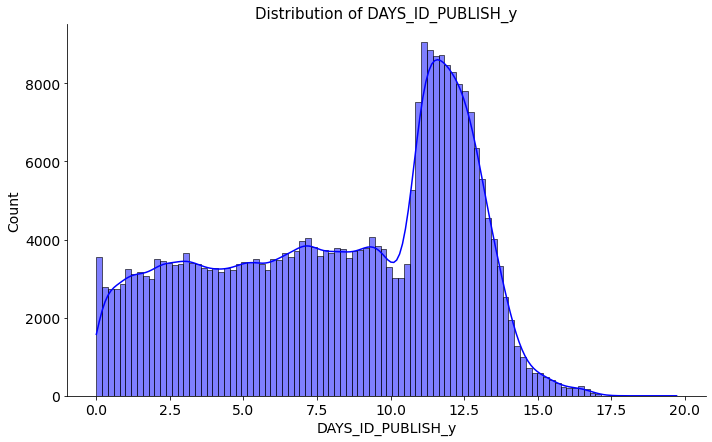

In [63]:
plot_distribution(col_dates, 'DAYS_ID_PUBLISH_y', 'blue', negative=True)

### 4.9. Comparison of interval values with TARGET = 1 and TARGET = 0

Let's compare the distribution of interval values ploted above for values of **TARGET = 1** and **TARGET = 0**

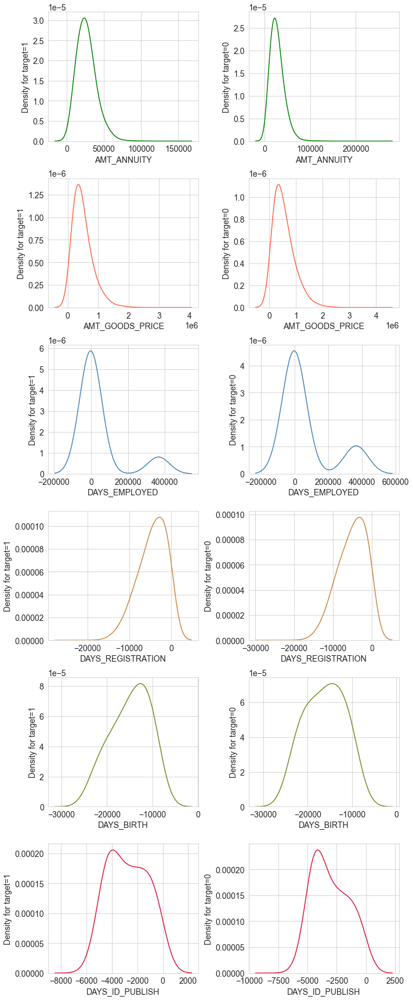

In [64]:
vars_to_plot = ['AMT_ANNUITY','AMT_GOODS_PRICE','DAYS_EMPLOYED', 'DAYS_REGISTRATION','DAYS_BIRTH','DAYS_ID_PUBLISH']
colors = ["green", "tomato", "steelblue", "peru", "olivedrab", "crimson"]
plot_distribution_comp(app_train, vars_to_plot, colors);

### 4.10. Region registered not live region and not work region

Let's represent the values of region registered and not live region and region registered and not work region.

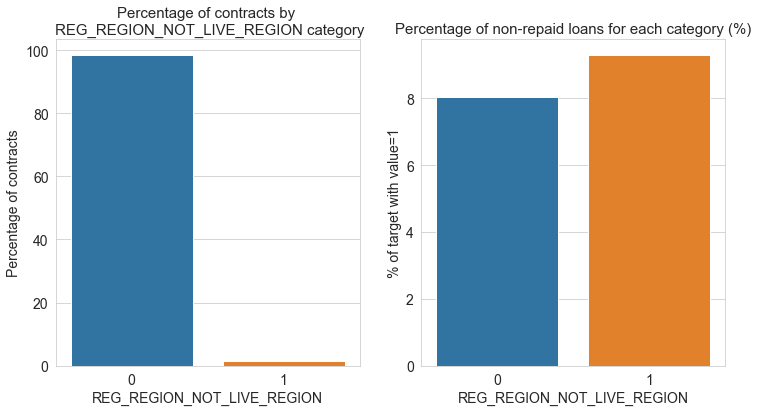

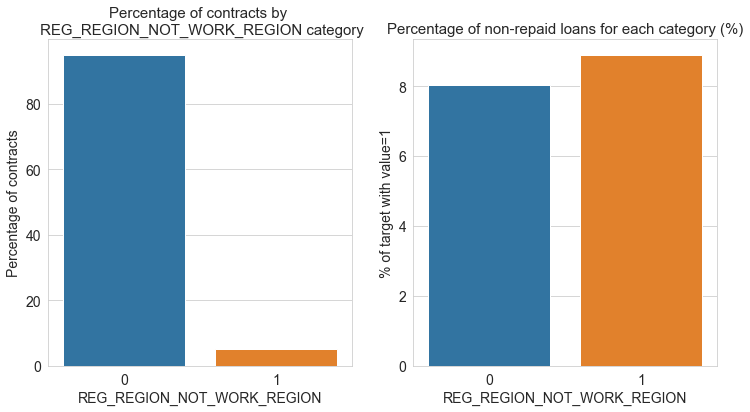

In [65]:
plot_stats(app_train, 'REG_REGION_NOT_LIVE_REGION')
plot_stats(app_train, 'REG_REGION_NOT_WORK_REGION')

Very few people are registered in not live or not work region. Generally, the rate of not return is slightly larger for these cases than in the rest (slightly above 8% compared with approx. 8%)

### 4.11. City registered not live city and not work city

Let's represent the values of City registered not live city and not work city.

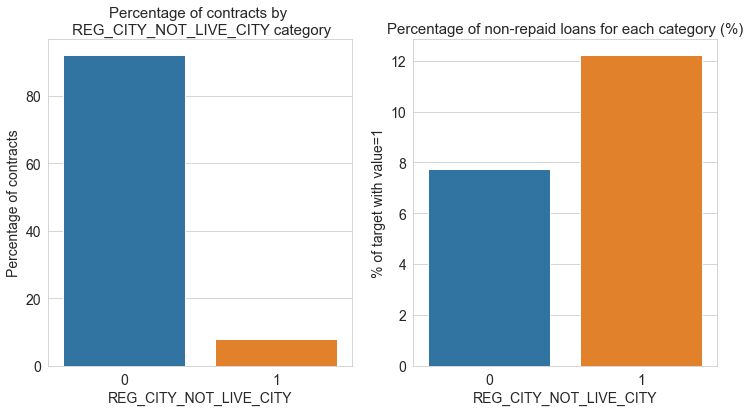

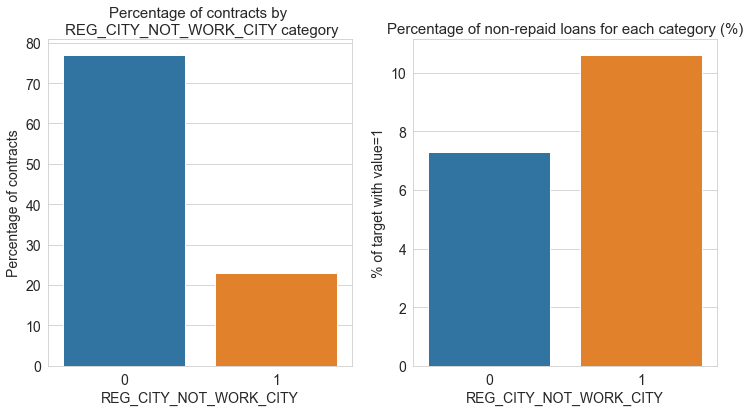

In [66]:
plot_stats(app_train, 'REG_CITY_NOT_LIVE_CITY')
plot_stats(app_train, 'REG_CITY_NOT_WORK_CITY')

Generally, much more people register in the city they live or work (a larger number register differently in the working city than living city).

The ones that register in different city than the working or living city are more frequently not-repaying the loans than the ones that register same city (work 11% or live 12%).

## 5. Bureau data

Bureau data contains all client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in the sample). For every loan in the sample, there are as many rows as number of credits the client had in Credit Bureau before the application date. **SK_ID_CURR** is the key connecting *application_train*|*test* data with *bureau* data.

Let's merge *application_train* with *bureau*.

In [66]:
app_bureau_train = app_train.merge(bureau, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [67]:
print("The resulting dataframe `application_bureau_train` has ",app_bureau_train.shape[0]," rows and ", 
      app_bureau_train.shape[1]," columns.")

The resulting dataframe `application_bureau_train` has  1465325  rows and  138  columns.


Creating a specific dataframe for date in day and transform them to years.

In [68]:
app_bureau_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY_x,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY_y
0,100002,1,Cash loans,M,N,Y,0,202500.0000,406597.5000,24700.5000,351000.0000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0188,-9461,-637,-3648.0000,-2120,NaN,1,1,0,1,1,0,Laborers,1.0000,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.0830,0.2629,0.1394,0.0247,0.0369,0.9722,0.6192,0.0143,0.0000,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0000,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.0000,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0000,2.0000,2.0000,2.0000,-1134.0000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,6158904,Closed,currency 1,-1125,0,-1038.0000,-1038.0000,NaN,0,40761.0000,NaN,NaN,0.0000,Credit card,-1038,0.0000
1,100002,1,Cash loans,M,N,Y,0,202500.0000,406597.5000,24700.5000,351000.0000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0188,-9461,-637,-3648.0000,-2120,NaN,1,1,0,1,1,0,Laborers,1.0000,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.0830,0.2629,0.1394,0.0247,0.0369,0.9722,0.6192,0.0143,0.0000,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0000,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.0000,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block 

In [69]:
app_bureau_train_dates = app_bureau_train[["DAYS_CREDIT", "CREDIT_DAY_OVERDUE", "DAYS_CREDIT_ENDDATE", 
                           "DAYS_ENDDATE_FACT", "DAYS_CREDIT_UPDATE"]]

In [70]:
app_bureau_train_dates["DAYS_CREDIT_y"] = app_bureau_train_dates["DAYS_CREDIT"]/365
app_bureau_train_dates["CREDIT_DAY_OVERDUE_y"] = app_bureau_train_dates["CREDIT_DAY_OVERDUE"]/365
app_bureau_train_dates["DAYS_CREDIT_ENDDATE_y"] = app_bureau_train_dates["DAYS_CREDIT_ENDDATE"]/365
app_bureau_train_dates["DAYS_ENDDATE_FACT_y"] = app_bureau_train_dates["DAYS_ENDDATE_FACT"]/365
app_bureau_train_dates["DAYS_CREDIT_UPDATE_y"] = app_bureau_train_dates["DAYS_CREDIT_UPDATE"]/365

<ipython-input-70-24c3b30e3e7f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app_bureau_train_dates["DAYS_CREDIT_y"] = app_bureau_train_dates["DAYS_CREDIT"]/365
<ipython-input-70-24c3b30e3e7f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app_bureau_train_dates["CREDIT_DAY_OVERDUE_y"] = app_bureau_train_dates["CREDIT_DAY_OVERDUE"]/365
<ipython-input-70-24c3b30e3e7f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

Let's now analize the *application_bureau_train* data.

### 5.1. Credit status

Let's see the credit status distribution. We show first the number of credits per category (could be *Closed*, *Active*, *Sold* and *Bad debt*).

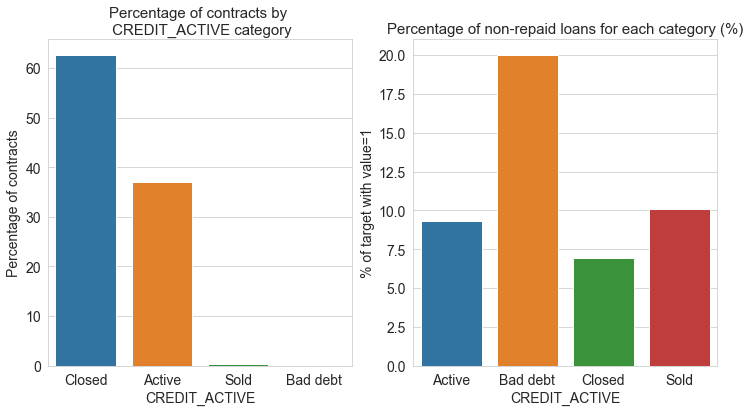

In [72]:
plot_stats(app_bureau_train, 'CREDIT_ACTIVE')

In [71]:
bureau_credit_status = bureau.groupby("CREDIT_ACTIVE").mean()
bureau_credit_status = bureau_credit_status[["CREDIT_DAY_OVERDUE", "AMT_CREDIT_SUM_OVERDUE"]]
bureau_credit_status

,CREDIT_DAY_OVERDUE,AMT_CREDIT_SUM_OVERDUE
CREDIT_ACTIVE,,
Active,1.8103,89.7392
Bad debt,313.6190,45818.0271
Closed,0.1047,2.6816
Sold,21.9364,709.0496


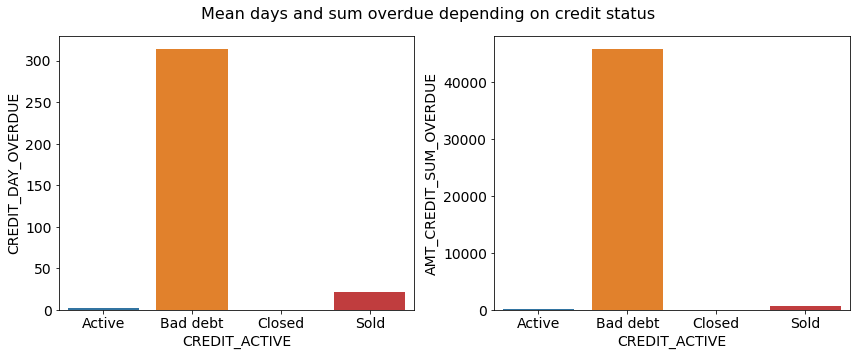

In [72]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), tight_layout=True)
fig.suptitle("Mean days and sum overdue depending on credit status")

sns.barplot(ax=ax1, data=bureau_credit_status, y="CREDIT_DAY_OVERDUE", x=bureau_credit_status.index)
sns.barplot(ax=ax2, data=bureau_credit_status, y="AMT_CREDIT_SUM_OVERDUE", x=bureau_credit_status.index);

Most of the credits registered at the Credit Bureau are in the status *Closed* (~900K). On the second place are the *Active* credits ( a bit under 600K). *Sold* and *Bad debt* are just a few.

In the same time, as percent having **TARGET = 1** from total number per category, clients with credits registered to the Credit Bureau with *Bad debt* have 20%  default on the currrent applications. 


Clients with credits *Sold*, *Active* and *Closed* have percent of **TARGET = 1** (default credit) equal or less than 10% (10% being the rate overall). The smallest rate of default credit have the clients with credits registered at the Credit Bureau with *Closed* credits.

That means the former registered credit history (as registered at Credit Bureau) is a strong predictor for the dafault credit, since the percent of applications defaulting with a history of *Bad debt* is twice as large as for *Sold* or *Active* and almost three times larger as for *Closed*.

### 5.2. Credit currency

Let's check now the number of credits registered at the Credit Bureau with different currencies. Also, let's check procent of defaulting credits (for current applications) per different currencies of credits credits registered at the Credit Bureau in the past for the same client.

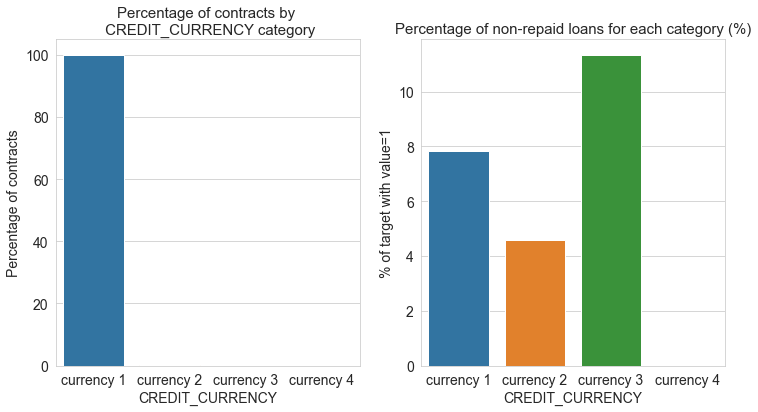

In [75]:
plot_stats(app_bureau_train, 'CREDIT_CURRENCY')

In [73]:
bureau_currency = bureau.groupby("CREDIT_CURRENCY").mean()
bureau_currency = bureau_currency[["CREDIT_DAY_OVERDUE", "AMT_CREDIT_SUM_OVERDUE"]]
bureau_currency

,CREDIT_DAY_OVERDUE,AMT_CREDIT_SUM_OVERDUE
CREDIT_CURRENCY,,
currency 1,0.8188,37.9432
currency 2,0.0000,0.9118
currency 3,0.0000,0.0000
currency 4,0.0000,0.0000


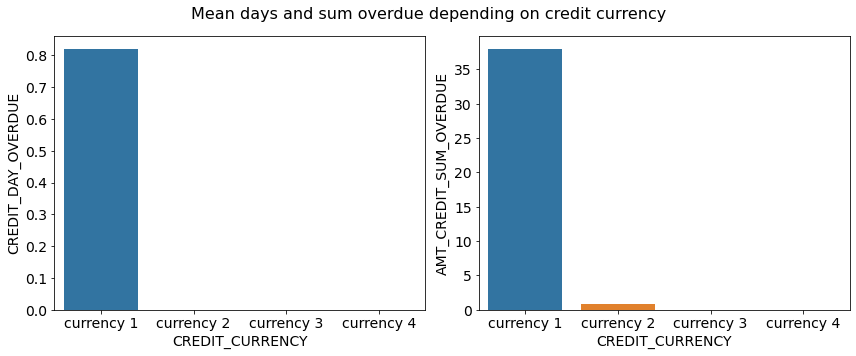

In [74]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), tight_layout=True)
fig.suptitle("Mean days and sum overdue depending on credit currency")

sns.barplot(ax=ax1, data=bureau_currency, y="CREDIT_DAY_OVERDUE", x=bureau_currency.index)
sns.barplot(ax=ax2, data=bureau_currency, y="AMT_CREDIT_SUM_OVERDUE", x=bureau_currency.index);

Credits are mostly in *currency_1*.

Depending on the currency, the percent of clients defaulting is quite different. Starting with *currency_3*, then *currency_1* and *currency_2*, the percent of clients defaulting is 11%, 8% and 5%. Percent of defaulting applications for clients that have credits registered with *currency_4* is close to 0.

### 5.3. Credit type

Let's check now the credit types for credits registered at the Credit Bureau.

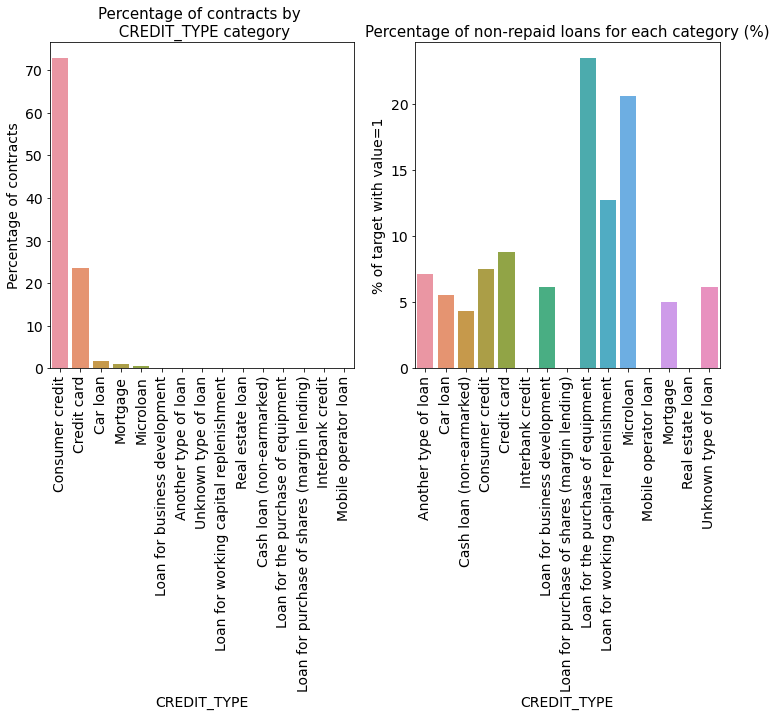

In [75]:
perc_previous_credit_type = plot_stats(app_bureau_train, 'CREDIT_TYPE', True, True, True)

Majority of historical credits registered at the Credit Bureau are *Consumer credit* and *Credit card*. Smaller number of credits are *Car loan*, *Mortgage* and *Microloan*.

Looking now to the types of historical credits registered at the Credit Bureau, there are few types with a high percent of current credit defaults, as following:  
* *Loan for the purchase of equipment* - with over 20% current credits defaults;  
* *Microloan* - with over 20% current credits defaults;  
* *Loan for working capital replenishement* - with over 12% current credits defaults.  


We will create a score between 0 and 10 proportional to the default % of previous credit types. 0 is the lowest default risk, 10 the highest.

### 5.4. Duration of credit (DAYS_CREDIT)

Let's check the distribution of number of days for the credit (registered at the Credit bureau).

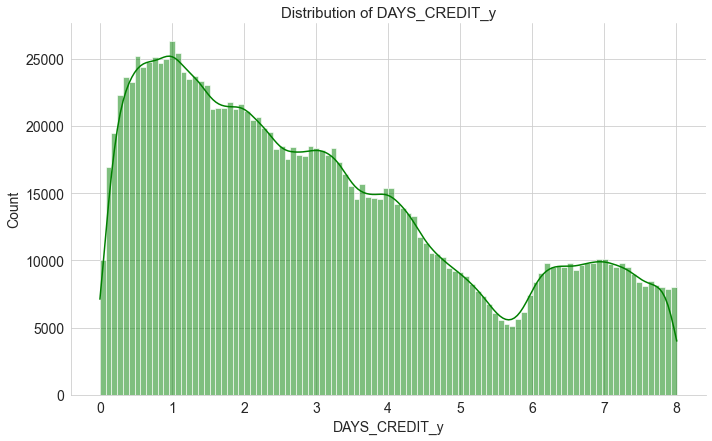

In [79]:
plot_distribution(app_bureau_train_dates, 'DAYS_CREDIT_y', 'green', negative=True)

The credit duration (in days) is ranging between about 8 years (with a local sadle around 7 years) and with a increasing frequence for shorter number of days - and with a peak around 1 year.

### 5.5. Credit overdue (CREDIT_DAY_OVERDUE)

Let's check the distribution of number of days for the credit overdue (registered at the Credit bureau).

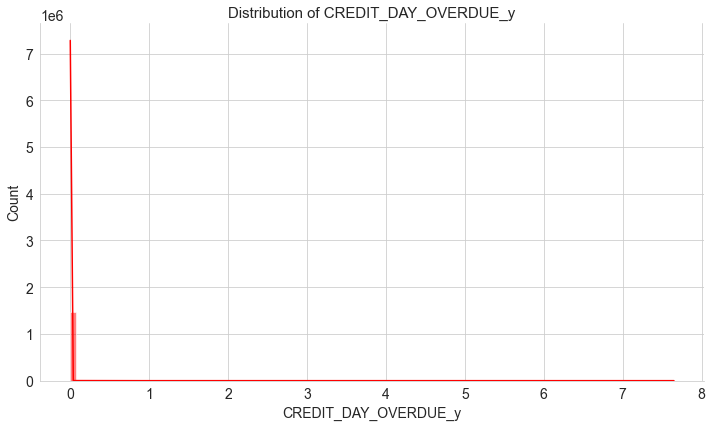

In [80]:
plot_distribution(app_bureau_train_dates, 'CREDIT_DAY_OVERDUE_y', 'red')

Most of the credits have 0 or close to 0 days overdue. The maximum number of credit days overdue is ~ 7 years and a half.

### 5.6. Credit sum  (AMT_CREDIT_SUM)

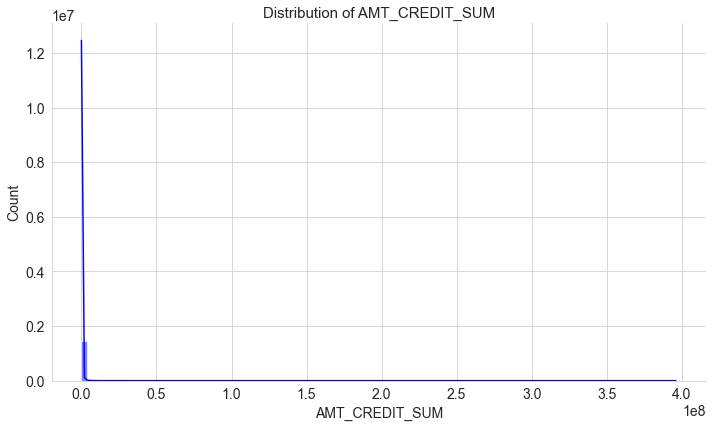

In [81]:
plot_distribution(app_bureau_train, 'AMT_CREDIT_SUM', 'blue')

The distribution of the AMT_CREDIT_SUM shows a concentration of the credits for the lower credit sum range.

Let's remove the outliers so that we can see better the distribution around 0.

Let's introduce a function to identify and filter the outliers (with a predefined threshold). 

Then, let's also modify the function to display a distribution, this time by using the function to filter the outliers.

In [76]:
# Source: https://stackoverflow.com/questions/11882393/matplotlib-disregard-outliers-when-plotting (see references)

def is_outlier(points, thresh=3.5):
    """
    Returns a boolean array with True if points are outliers and False 
    otherwise.

    Parameters:
    -----------
        points : An numobservations by numdimensions array of observations
        thresh : The modified z-score to use as a threshold. Observations with
            a modified z-score (based on the median absolute deviation) greater
            than this value will be classified as outliers.

    Returns:
    --------
        mask : A numobservations-length boolean array.

    References:
    ----------
        Boris Iglewicz and David Hoaglin (1993), "Volume 16: How to Detect and
        Handle Outliers", The ASQC Basic References in Quality Control:
        Statistical Techniques, Edward F. Mykytka, Ph.D., Editor. 
    """
    if len(points.shape) == 1:
        points = points[:,None]
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > thresh

In [77]:
def plot_distribution_outlier(df, feature, color):
    """
    """
    fig, ax = plt.subplots(figsize=(11, 5))
    
    x = df[feature].dropna()
    filtered = x[~is_outlier(x)]
    
    sns.histplot(ax=ax, x=filtered, color=color, kde=True,bins=100)
    ax.set_title(f"Distribution of {feature}")


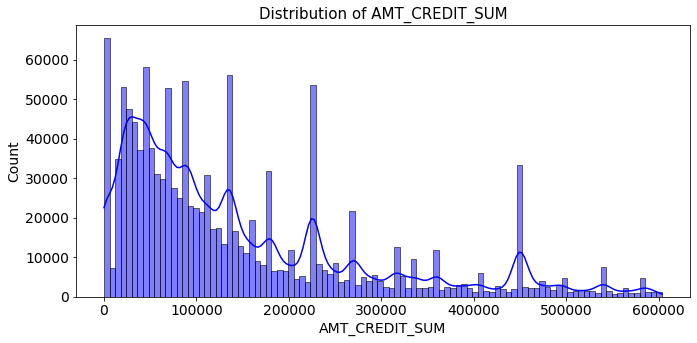

In [78]:
plot_distribution_outlier(app_bureau_train, 'AMT_CREDIT_SUM', 'blue')

We can observe that the distribution function shows several peaks and the maximum concentration of the values is around 20,000 but we also see several other peaks at higher values.

### 5.7. Credit sum limit (AMT_CREDIT_SUM_LIMIT)

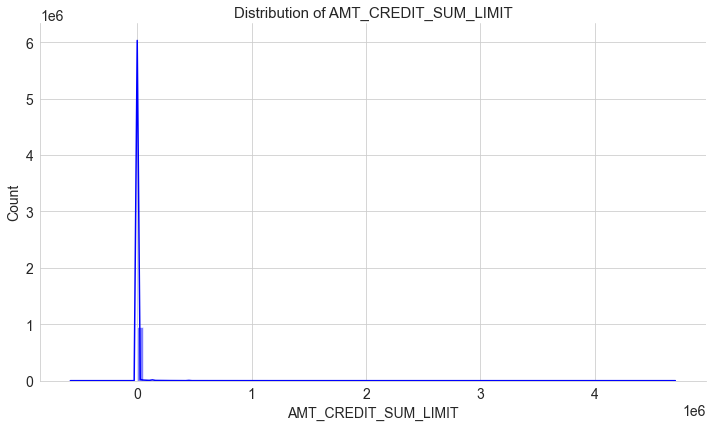

In [85]:
plot_distribution(app_bureau_train, 'AMT_CREDIT_SUM_LIMIT', 'blue')

### 5.8. Comparison of interval values with TARGET = 1 and TARGET = 0

Let's compare the distribution of interval values ploted above for values of **TARGET = 1** and **TARGET = 0**

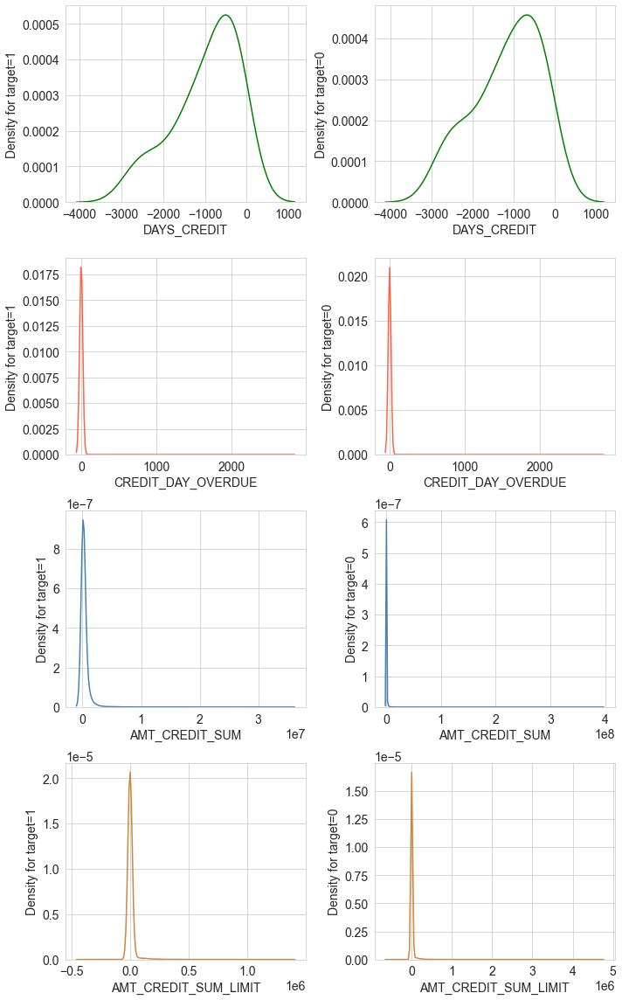

In [86]:
vars_to_plot = ['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_LIMIT']
colors = ["green", "tomato", "steelblue", "peru"]
plot_distribution_comp(app_bureau_train, vars_to_plot, colors)

## 6. Previous application data


The dataframe *previous_application* contains information about all previous applications for Home Credit loans of clients who have loans in the sample. There is one row for each previous application related to loans in our data sample. **SK_ID_CURR** is the key connecting *application_train*|*test* data with *previous_application* data.

Let's merge *application_train* with *previous_application*.

In [79]:
app_prev_train = app_train.merge(previous_app, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [80]:
print("The resulting dataframe `application_prev_train` has ", app_prev_train.shape[0]," rows and ", 
      app_prev_train.shape[1]," columns.")

The resulting dataframe `application_prev_train` has  1413701  rows and  158  columns.


### 6.1. Contract type

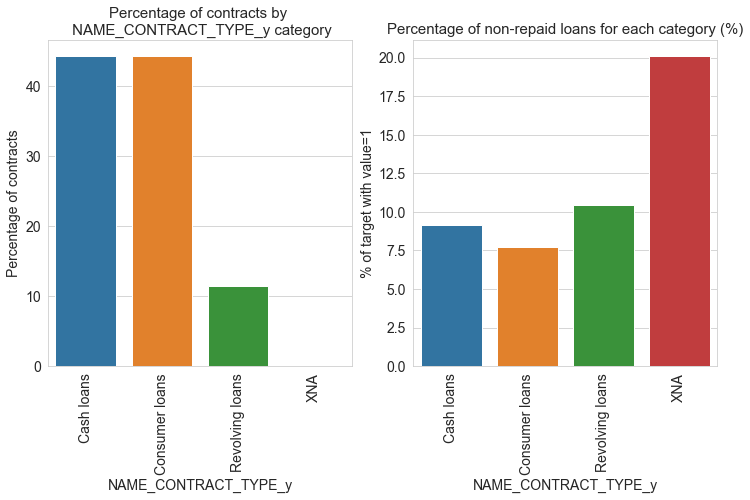

In [89]:
plot_stats(app_prev_train, 'NAME_CONTRACT_TYPE_y', True)

There are 4 types of contract in the previous application data: *Cash loans*, *Consumer loans*, *Revolving loans*, *XNA*. *Cash loans* and *Consumer loans* are almost the same number (~45%) whilst *Revolving loans* are ~10% and only a few hundreds *XNA*.

The percent of defauls loans for clients with previous applications is different for the type of previous applications contracts, decreasing from ~20% for *XNA* to ~10% for *Revolving loans*, then ~ 9.5% for *Cash loans* and ~7.5% for *Consumer loans*.

### 6.2. Cash loan purpose

Let's look to the cash loan purpose, in the case of cash loans.

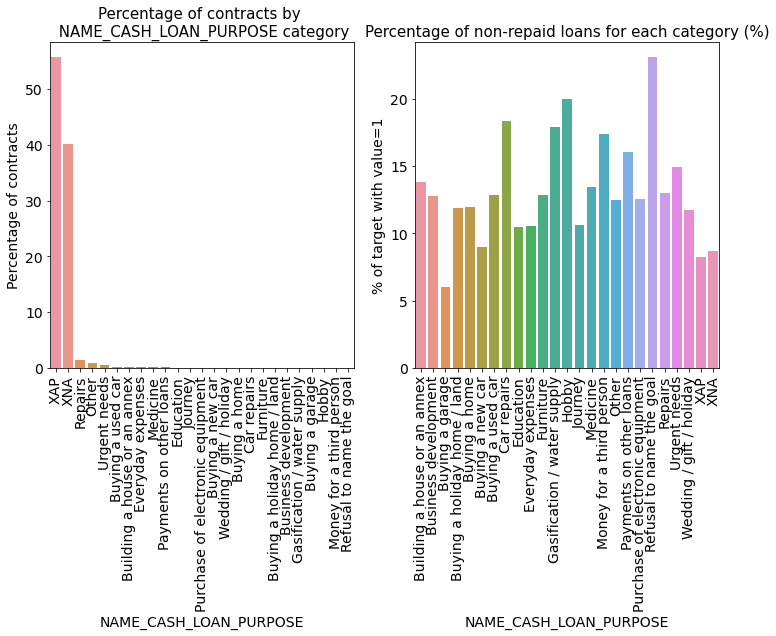

In [81]:
perc_cash_loan_purpose = plot_stats(app_prev_train, 'NAME_CASH_LOAN_PURPOSE', True, True, True)

Besides not identifed/not available categories, *Repairs*, *Other*, *Urgent needs*, *Buying a used car*, *Building a house or an annex* accounts for the largest number of contracts.


In terms of percent of defaults for current applications in the sample, clients with history of previous applications have largest percents of defaults when in their history are previous applications for cash loans for *Refusal to name the goal* - ~23% (which makes a lot of sense), *Hobby* (20%), *Car repairs* (~18%).

### 6.3. Contract status

Let's look to the contract status.

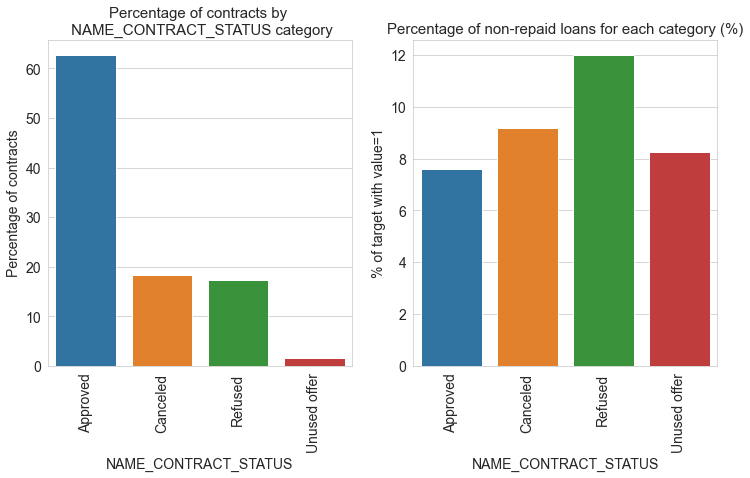

In [91]:
plot_stats(app_prev_train, 'NAME_CONTRACT_STATUS', True, True)

Most previous applications contract statuses are *Approved* (~60%), *Canceled* and *Refused* (~19%). There are only ~1% in status *Unused offer*.

In terms of percent of defaults for current applications in the sample, clients with history of previous applications have largest percents of defaults when in their history contract statuses are *Refused* (12%), followed by *Canceled* (9%), *Unused offer* (~8%) and *Approved* (lowest percent of defaults in current applictions, with less than 8%).

### 6.4. Payment type

Let's check the payment type.

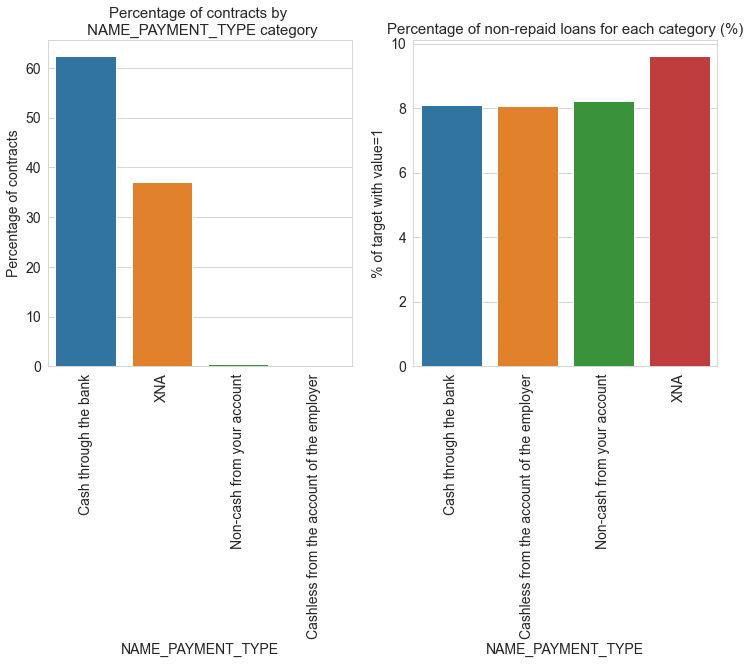

In [92]:
plot_stats(app_prev_train, 'NAME_PAYMENT_TYPE', True, True)

Most of the previous applications were paid with *Cash through the bank* (>60%). Payments using *Non-cash from your account* or *Cashless from the account of the employer* are much rare. These three types of payments in previous applications results in allmost the same percent of defaults for current clients (~8% each).

33% XNA ??

### 6.5. Client type

Let's check the client type for previous applications.

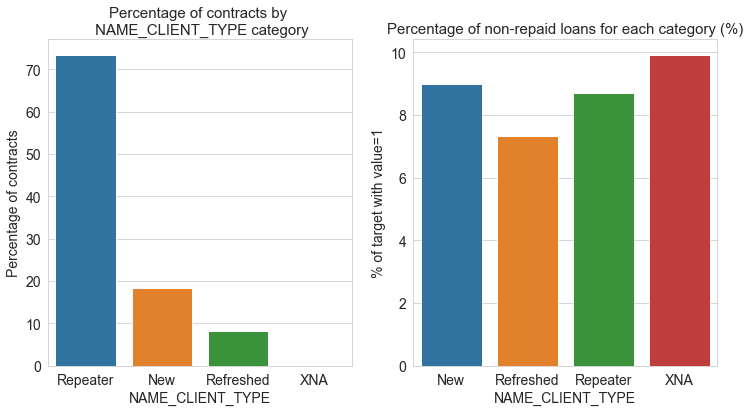

In [93]:
plot_stats(app_prev_train, 'NAME_CLIENT_TYPE')

Most of the previous applications have client type *Repeater* (>70%), ~19% are *New* and <10% are *Refreshed*.

In terms of default percent for current applications of clients with history of previous applications, current clients with previous applications have values of percent of defaults ranging from from 8.5%, 8.25% and 7% corresponding to client types in the past *New*, *Repeater* and *Refreshed*, respectivelly.

XNA ?

### 6.6. Purpose of previous application

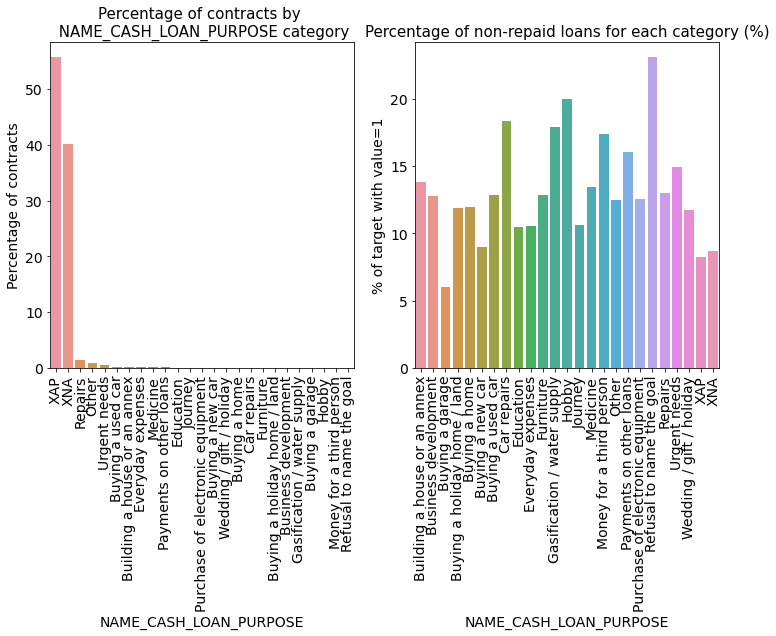

In [82]:
perc_name_cash_loan_purpose = plot_stats(app_prev_train, 'NAME_CASH_LOAN_PURPOSE', label_rotation=True, return_df=True)

### 6.7. Code for rejection reason in previous application.

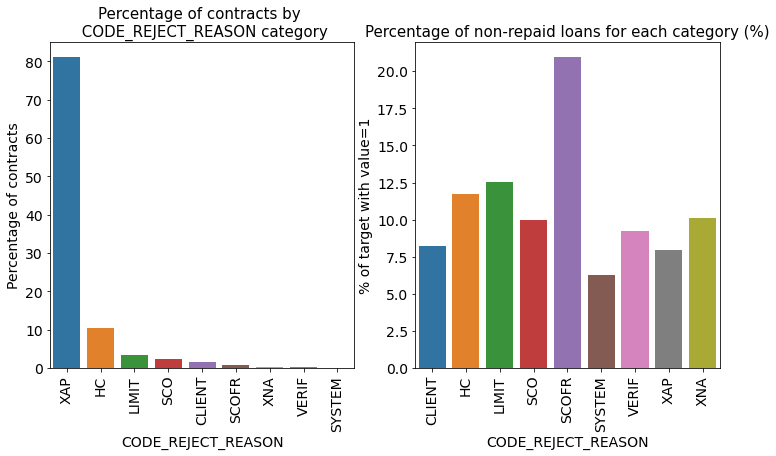

In [83]:
perc_code_reject_reason = plot_stats(app_prev_train, 'CODE_REJECT_REASON', label_rotation=True, return_df=True)

### 6.8. What kind of goods did the client apply for in the previous application

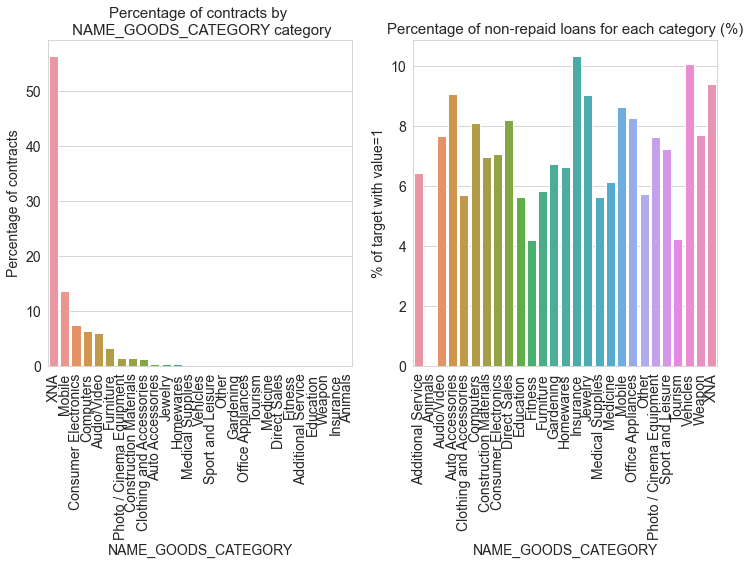

In [96]:
plot_stats(app_prev_train, 'NAME_GOODS_CATEGORY', True)

### 6.9. Name yield group

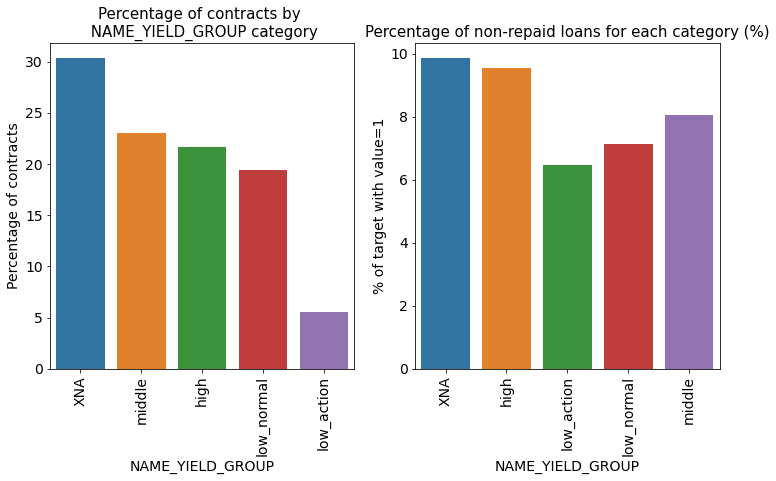

In [84]:
perc_name_yield_group = plot_stats(app_prev_train, "NAME_YIELD_GROUP", label_rotation=True, return_df=True)

### 6.10. Product combination

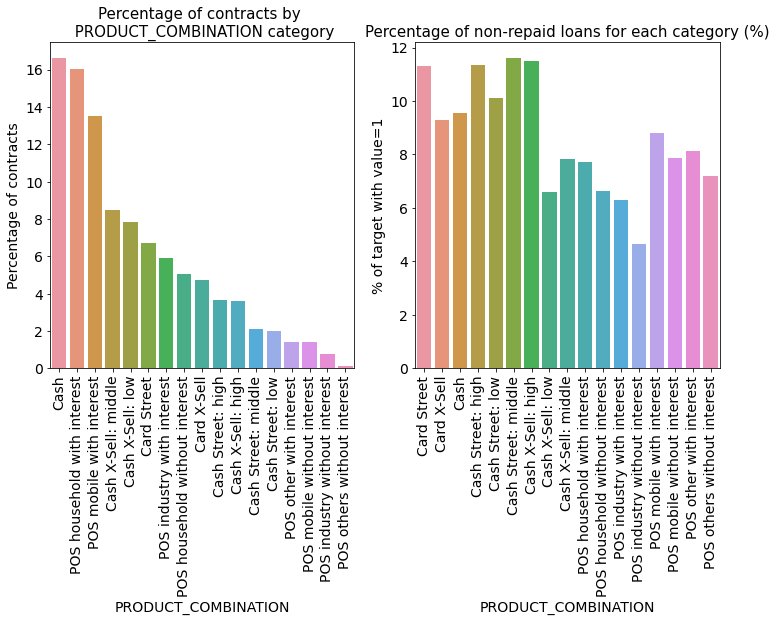

In [85]:
perc_product_combination = plot_stats(app_prev_train, "PRODUCT_COMBINATION", label_rotation=True, return_df=True)

### 6.11. Channel type

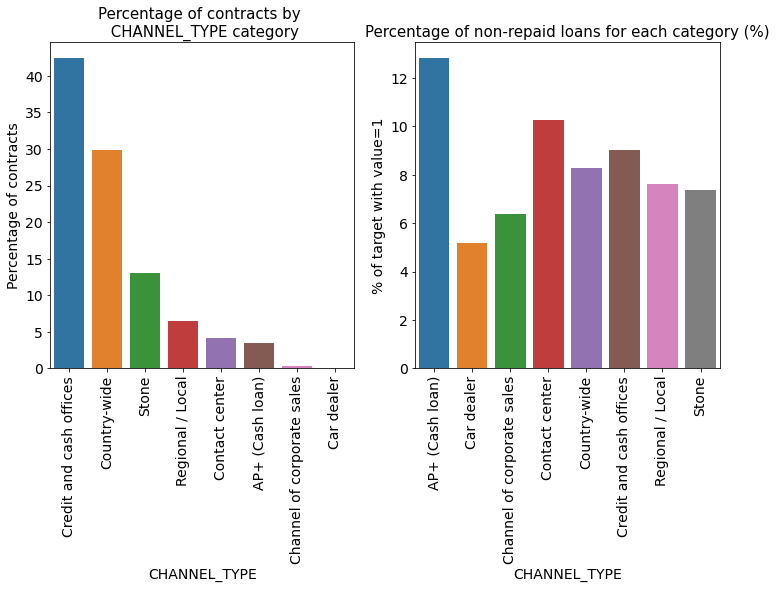

In [86]:
perc_channel_type = plot_stats(app_prev_train, "CHANNEL_TYPE", label_rotation=True, return_df=True)

### 6.12. Name seller industry

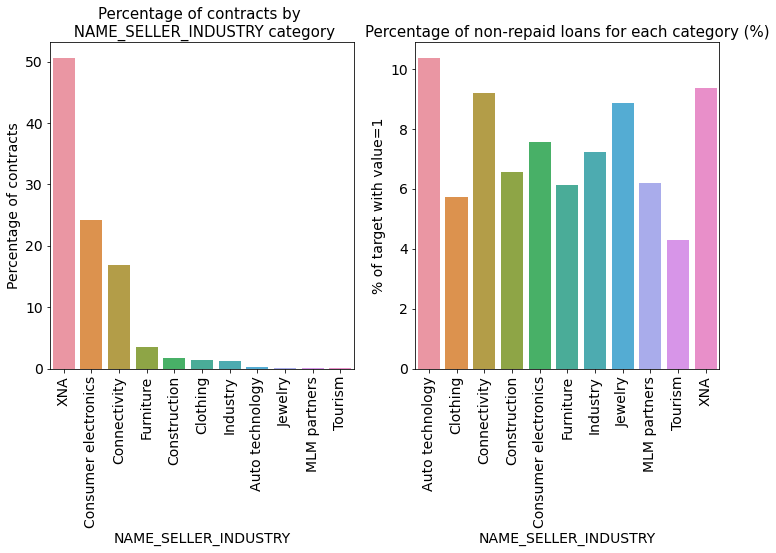

In [87]:
perc_name_seller_industry = plot_stats(app_prev_train, "NAME_SELLER_INDUSTRY", label_rotation=True, return_df=True)

### 6.13. Name goods category

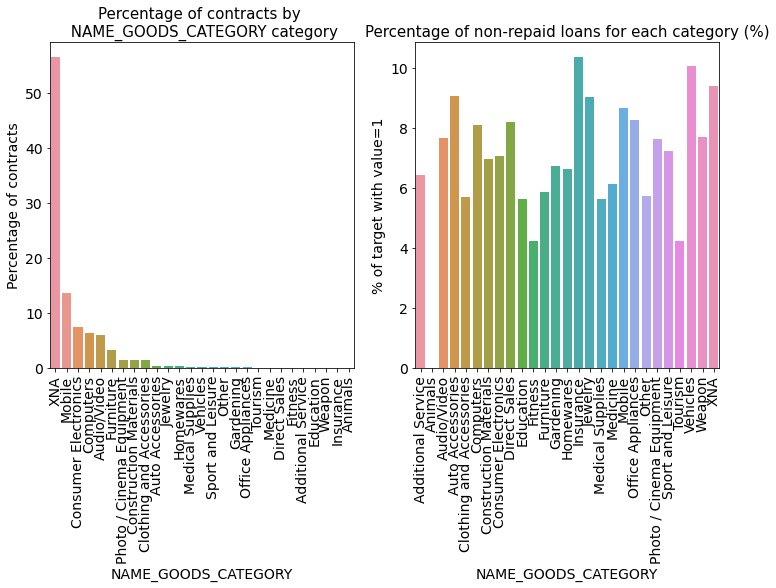

In [88]:
perc_name_goods_category = plot_stats(app_prev_train, "NAME_GOODS_CATEGORY", label_rotation=True, return_df=True)

## 7. POS_CASH balance

In [89]:
pos_cash.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0000,45.0000,Active,0,0
1,1715348,367990,-33,36.0000,35.0000,Active,0,0
2,1784872,397406,-32,12.0000,9.0000,Active,0,0
3,1903291,269225,-35,48.0000,42.0000,Active,0,0
4,2341044,334279,-35,36.0000,35.0000,Active,0,0


In [90]:
app_train_pos = app_train.merge(pos_cash, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [91]:
print("The resulting dataframe `app_train_pos` has ", app_train_pos.shape[0]," rows and ", 
      app_train_pos.shape[1]," columns.")

The resulting dataframe `app_train_pos` has  8543375  rows and  129  columns.


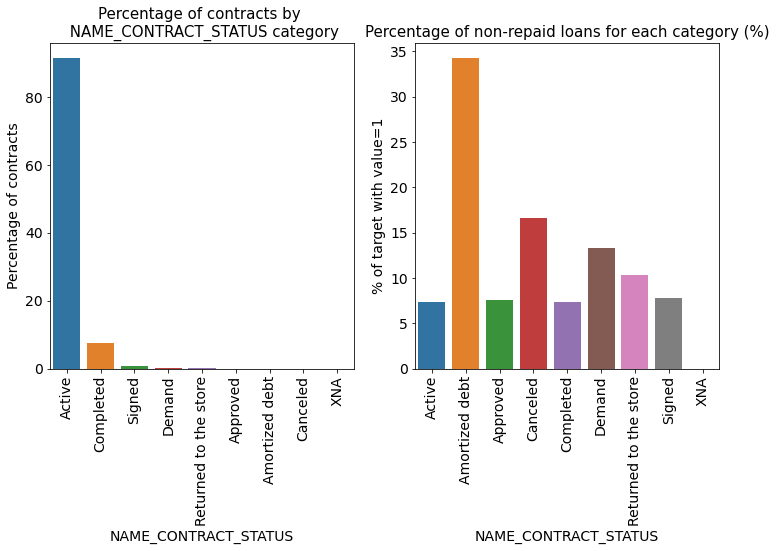

In [92]:
plot_stats(app_train_pos, "NAME_CONTRACT_STATUS", label_rotation=True)

## 8. Merging datasets and feature engineering

Most features are created by applying min, max, mean, sum and var functions to grouped tables. 
All tables are joined with the application DF using the SK_ID_CURR key (except bureau_balance).
The following key ideas were used:
* Divide or subtract important features to get rates (like annuity and income)
* Modularity: one function for each table (except bureau_balance and application_test)
* Categorical variables to merge are replaced by the score between 0 and 10 calculated in the EDA and based on the % of the clients belonging to the classes who made default.
* Categorical variable of the application_train dataset are left untouch (encoded later in the modeling part).

### 8.1. Transform important categorical features

In [93]:
def categorical_to_ordinal(df, feature):
    """
    Transform a categorical feature into a numeric one (ordinal score.)
    The created score (between 0 and 10) is proportional to the % of previous application with credit default.
    10 means highest default risk, 0 lowest.
    Return a dataframe with mean values for target=1 (non-repaid loans) and corresponding score,
    and a dictionnary with feature value and score.
    """
    score_name = "SCORE_" + feature
    # Making a score
    df.sort_values(by="TARGET", ascending=False, inplace=True)
    df[score_name] = df["TARGET"]*10/df["TARGET"].max()
    
    # Create a dict with score values for future mapping
    score_df = df.set_index(feature)
    score_df.drop("TARGET", axis=1, inplace=True)
    score_dict = score_df.to_dict("index")
    keys = list(score_dict.keys())
    values = [score_dict[k][score_name] for k in keys]
    score_dict = {k:v for k, v in zip(keys, values)}
    score_dict

    return df, score_dict

#### 8.1.1. Bureau and bureau balance

Following our exploration analysis, we will create ordinal categorical features and numerical features based on the % of clients with non-repaid loans for this category. A higher value will always mean a higher risk of default.

Categorical features with little or no impact on default risk will be dropped.

In [94]:
# Mapping ordinal categorical features
categ_bb_status = {"X": np.nan,
                    "C": 0,
                    "0": 0,
                    "1": 1,
                    "2": 2,
                    "3": 3,
                    "4": 4,
                    "5": 5}
categ_b_currency = {"currency 4": 0,
                    "currency 2": 1,
                    "currency 1": 2,
                    "currency 3": 3}
categ_b_credit_active = {"Closed": 0,
                    "Active": 1,
                    "Sold": 1,
                    "Bad debt": 2}

In [95]:
# Making a score from % of non-repaid loans
perc_previous_credit_type, credit_type_score = categorical_to_ordinal(perc_previous_credit_type, "CREDIT_TYPE")

In [96]:
# Target = % of non repaid-loans with this CREDIT_TYPE category
# Score_credit_type = attributed score (between 0 and 10)
perc_previous_credit_type

,CREDIT_TYPE,TARGET,SCORE_CREDIT_TYPE
8,Loan for the purchase of equipment,23.5294,10.0000
10,Microloan,20.6441,8.7737
9,Loan for working capital replenishment,12.7321,5.4111
4,Credit card,8.8009,3.7404
3,Consumer credit,7.4837,3.1806
0,Another type of loan,7.1429,3.0357
6,Loan for business development,6.1592,2.6177
14,Unknown type of loan,6.1441,2.6112
1,Car loan,5.5731,2.3686
12,Mortgage,4.9978,2.1240


In [97]:
# Dict for futur mapping
credit_type_score

{'Loan for the purchase of equipment': 10.0,
 'Microloan': 8.773736812881733,
 'Loan for working capital replenishment': 5.411140583554377,
 'Credit card': 3.740362887629307,
 'Consumer credit': 3.180556464505755,
 'Another type of loan': 3.0357142857142856,
 'Loan for business development': 2.617664148750727,
 'Unknown type of loan': 2.6112288135593222,
 'Car loan': 2.3685650545102495,
 'Mortgage': 2.12404690203114,
 'Cash loan (non-earmarked)': 1.847826086956522,
 'Interbank credit': 0.0,
 'Loan for purchase of shares (margin lending)': 0.0,
 'Mobile operator loan': 0.0,
 'Real estate loan': 0.0}

In [98]:
# Replacing categorical features by numerical/ordinal ones in bureau and bureau balance datasets
bureau_all_num = bureau.copy()
bureau_bal_all_num = bureau_bal.copy()

features = ["CREDIT_ACTIVE", "CREDIT_CURRENCY", "CREDIT_TYPE"]
scores = [categ_b_credit_active, categ_b_currency, credit_type_score]

for feature, score in zip(features, scores):
    bureau_all_num[feature] = bureau_all_num[feature].map(score)

bureau_bal_all_num["STATUS"] = bureau_bal_all_num["STATUS"].map(categ_bb_status)

In [99]:
bureau_all_num.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,0,2,-497,0,-153.0000,-153.0000,NaN,0,91323.0000,0.0000,NaN,0.0000,3.1806,-131,NaN
1,215354,5714463,1,2,-208,0,1075.0000,NaN,NaN,0,225000.0000,171342.0000,NaN,0.0000,3.7404,-20,NaN
2,215354,5714464,1,2,-203,0,528.0000,NaN,NaN,0,464323.5000,NaN,NaN,0.0000,3.1806,-16,NaN
3,215354,5714465,1,2,-203,0,NaN,NaN,NaN,0,90000.0000,NaN,NaN,0.0000,3.7404,-16,NaN
4,215354,5714466,1,2,-629,0,1197.0000,NaN,77674.5000,0,2700000.0000,NaN,NaN,0.0000,3.1806,-21,NaN


In [100]:
bureau_bal_all_num.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,0.0000
1,5715448,-1,0.0000
2,5715448,-2,0.0000
3,5715448,-3,0.0000
4,5715448,-4,0.0000


#### 8.1.2. Previous applications

Same procedure as for bureau and bureau balance datasets.

In [101]:
# Defining ordinal categories depending on default risk
categ_prev_name_contract_type = {"XNA": 4,
                                "Revolvng loans": 2,
                                "Cash loans": 1,
                                "Consumer loans": 0}
categ_prev_name_contract_status = {"Refused": 3,
                                "Canceled": 2,
                                "Unused offer": 1,
                                "Approved": 0}
categ_prev_name_yield_group = {"XNA": 3,
                                "High": 3,
                                "middle": 2,
                                "low_normal": 1,
                                "low_action": 0}
categ_prev_name_product_type = {"walk-in":1,
                                "XNA": 0,
                                "x-sell": 3}
categ_prev_flag_last_appl_per_contract = {"N": 1, "Y": 0}

In [102]:
# Making scores from categories proportional to default risk
perc_code_reject_reason, score_code_reject_reason = categorical_to_ordinal(perc_code_reject_reason, "CODE_REJECT_REASON")
perc_name_cash_loan_purpose, score_name_cash_loan_purpose = categorical_to_ordinal(perc_name_cash_loan_purpose, 
                                                                                "NAME_CASH_LOAN_PURPOSE")
perc_product_combination, score_product_combination = categorical_to_ordinal(perc_product_combination, "PRODUCT_COMBINATION")
perc_channel_type, score_channel_type = categorical_to_ordinal(perc_channel_type, "CHANNEL_TYPE")
perc_name_seller_industry, score_name_seller_industry = categorical_to_ordinal(perc_name_seller_industry, "NAME_SELLER_INDUSTRY")
perc_name_goods_category, score_name_goods_category = categorical_to_ordinal(perc_name_goods_category, "NAME_GOODS_CATEGORY")

In [103]:
previous_app_all_num = previous_app.copy()

features = ["NAME_CONTRACT_TYPE", "NAME_CONTRACT_STATUS", "NAME_YIELD_GROUP", "NAME_PRODUCT_TYPE", "FLAG_LAST_APPL_PER_CONTRACT", 
    "CODE_REJECT_REASON", "NAME_CASH_LOAN_PURPOSE", "PRODUCT_COMBINATION", 
    "CHANNEL_TYPE", "NAME_SELLER_INDUSTRY", "NAME_GOODS_CATEGORY"]
scores = [categ_prev_name_contract_type, categ_prev_name_contract_status, categ_prev_name_yield_group,
    categ_prev_name_product_type, categ_prev_flag_last_appl_per_contract,
    score_code_reject_reason, score_name_cash_loan_purpose, score_product_combination,
    score_channel_type, score_name_seller_industry, score_name_goods_category]

# Replace classes by ordinal or numerical value
for feature, score in zip(features, scores):
    previous_app_all_num[feature] = previous_app_all_num[feature].map(score)

# Drop categorical columns with little influence on default risk
previous_app_all_num.drop(["WEEKDAY_APPR_PROCESS_START", "NAME_PAYMENT_TYPE", "NAME_TYPE_SUITE", "NAME_CLIENT_TYPE",
    "NAME_PORTFOLIO"], axis=1, inplace=True)

In [104]:
previous_app_all_num.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,CODE_REJECT_REASON,NAME_GOODS_CATEGORY,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,0.0000,1730.4300,17145.0000,17145.0000,0.0000,17145.0000,15,0,1,0.0000,0.1828,0.8673,3.5883,0,-73,3.7975,8.3588,0,6.4367,35,8.8806,12.0000,2.0000,7.5852,365243.0000,-42.0000,300.0000,-42.0000,-37.0000,0.0000
1,2802425,108129,1.0000,25188.6150,607500.0000,679671.0000,NaN,607500.0000,11,0,1,NaN,NaN,NaN,3.7775,0,-164,3.7975,9.0729,3,8.0067,-1,9.0238,36.0000,0.0000,5.6676,365243.0000,-134.0000,916.0000,365243.0000,365243.0000,1.0000
2,2523466,122040,1.0000,15060.7350,112500.0000,136444.5000,NaN,112500.0000,11,0,1,NaN,NaN,NaN,3.7775,0,-301,3.7975,9.0729,3,7.0253,-1,9.0238,12.0000,NaN,9.8950,365243.0000,-271.0000,59.0000,365243.0000,365243.0000,1.0000
3,2819243,176158,1.0000,47041.3350,450000.0000,470790.0000,NaN,450000.0000,7,0,1,NaN,NaN,NaN,3.7775,0,-512,3.7975,9.0729,3,7.0253,-1,9.0238,12.0000,2.0000,6.7461,365243.0000,-482.0000,-152.0000,-182.0000,-177.0000,1.0000
4,1784265,202054,1.0000,31924.3950,337500.0000,404055.0000,NaN,337500.0000,9,0,1,NaN,NaN,NaN,5.6350,3,-781,5.6067,9.0729,1,7.0253,-1,9.0238,24.0000,NaN,9.7833,NaN,NaN,NaN,NaN,NaN,NaN


### 8.1.3. POS_CASH balance

In [105]:
pos_cash_all_num = pos_cash.copy()

categ_pos_name_contract_status = {"Amortized debt": 4,
                                "Canceled": 2,
                                "Demand": 1,
                                "Returned to the store": 1,
                                "XNA": 0,
                                "Signed": 0,
                                "Completed": 0,
                                "Approved": 0,
                                "Active": 0}

pos_cash_all_num["NAME_CONTRACT_STATUS"] = pos_cash_all_num["NAME_CONTRACT_STATUS"].map(categ_pos_name_contract_status)

In [106]:
pos_cash_all_num.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0000,45.0000,0,0,0
1,1715348,367990,-33,36.0000,35.0000,0,0,0
2,1784872,397406,-32,12.0000,9.0000,0,0,0
3,1903291,269225,-35,48.0000,42.0000,0,0,0
4,2341044,334279,-35,36.0000,35.0000,0,0,0


### 8.2. Aggregation functions

In [107]:
@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

In [108]:
# Preprocess application_train.csv and application_test.csv
def application_train_agg(df, remove_XNA_CODE_GENDER=True, debug=False):
    
    print(f"INITIAL SHAPE: n_rows: {df.shape[0]} / n_columns: {df.shape[1]}.")
    
    # Optional: Debug mode: keep only the first 1000 rows
    # Optional: Remove 4 applications with XNA CODE_GENDER
    
    if debug:
        print("Debug mode ON")
        df_new = df[:1000].copy()
        if remove_XNA_CODE_GENDER:
            df_new[df_new['CODE_GENDER'] != 'XNA']
            print("Removed XNA_CODE_GENDER.")
    else:
        df_new = df.copy()
        if remove_XNA_CODE_GENDER:
            df_new = df_new[df_new['CODE_GENDER'] != 'XNA']
            print("Removed XNA_CODE_GENDER.")

    # Replace NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df_new['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df_new['DAYS_EMPLOYED_PERC'] = df_new['DAYS_EMPLOYED'] / df_new['DAYS_BIRTH']
    df_new['INCOME_CREDIT_PERC'] = df_new['AMT_INCOME_TOTAL'] / df_new['AMT_CREDIT']
    df_new['INCOME_PER_PERSON'] = df_new['AMT_INCOME_TOTAL'] / df_new['CNT_FAM_MEMBERS']
    df_new['ANNUITY_INCOME_PERC'] = df_new['AMT_ANNUITY'] / df_new['AMT_INCOME_TOTAL']
    df_new['PAYMENT_RATE'] = df_new['AMT_ANNUITY'] / df_new['AMT_CREDIT']
    # Collect garbages
    gc.collect()
    
    print(f"FINAL SHAPE: n_rows: {df_new.shape[0]} / n_columns: {df_new.shape[1]}.")
    return df_new

In [109]:
# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance_agg(df_bureau, df_bureau_balance, debug=False):
    
    if debug:
        df_bureau_new = df_bureau[:1000].copy()
        df_bureau_balance_new = df_bureau_balance[:1000].copy()
    else:
        df_bureau_new = df_bureau.copy()
        df_bureau_balance_new = df_bureau_balance.copy()
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size'],
                      "STATUS": ["mean"]}

    bb_agg = df_bureau_balance_new.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    
    df_bureau_new = df_bureau_new.join(bb_agg, how='left', on='SK_ID_BUREAU')
    
    del bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    
    # Categorical (ordinal) aggregations
    cat_aggregations = {
        'CREDIT_ACTIVE': ['mean', 'sum'],
        'CREDIT_CURRENCY': ['mean'],
        'CREDIT_TYPE': ['mean', 'max']
    }
    
    bureau_agg = df_bureau_new.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BUREAU_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])

    return bureau_agg

In [110]:
# Preprocess previous_applications.csv
def previous_applications_agg(df, debug=False):
    
    if debug:
        df_prev_app = df[:1000].copy()
    else:
        df_prev_app = df.copy()

    # Days 365.243 values -> nan
    df_prev_app['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    df_prev_app['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    df_prev_app['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    df_prev_app['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    df_prev_app['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    df_prev_app['APP_CREDIT_PERC'] = df_prev_app['AMT_APPLICATION'] / df_prev_app['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {
        'NAME_CONTRACT_TYPE': ['max', 'mean'],
        'FLAG_LAST_APPL_PER_CONTRACT': ['mean'],
        'NAME_CASH_LOAN_PURPOSE': ['max', 'mean'],
        'NAME_CONTRACT_STATUS': ['max', 'mean'],
        'CODE_REJECT_REASON': ['max', 'mean'],
        'NAME_GOODS_CATEGORY': ['max', 'mean'],
        'NAME_PRODUCT_TYPE': ['mean'],
        'CHANNEL_TYPE': ['max', 'mean'],
        'NAME_SELLER_INDUSTRY': ['max', 'mean'],
        'NAME_YIELD_GROUP': ['mean'],
        'PRODUCT_COMBINATION': ['max', 'mean'],
    }
    
    prev_agg = df_prev_app.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])

    del df_prev_app
    gc.collect()

    return prev_agg

In [111]:
# Preprocess POS_CASH_balance.csv
def pos_cash_agg(df, debug=False):

    if debug:
        df_pos_cash = df[:1000].copy()
    else:
        df_pos_cash = df.copy()

    #df_pos_cash.drop(["CNT_INSTALMENT", "CNT_INSTALMENT_FUTURE", "SK_ID_PREV"], axis=1, inplace=True)

    # Numerical features aggregation
    num_aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }

    # categorical feature aggregation
    cat_aggregations = {
        'NAME_CONTRACT_STATUS': ['min', 'max']
    }
    
    pos_agg = df_pos_cash.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = df_pos_cash.groupby('SK_ID_CURR').size()

    del df_pos_cash
    gc.collect()
    
    return pos_agg

In [112]:
# Preprocess df_installtallments_payments.csv
def installments_payments_agg(df, debug=False):

    if debug:
        df_install = df[:1000].copy()
    else:
        df_install = df.copy()

    # Percentage and difference paid in each df_installtallment (amount paid and df_installtallment value)
    df_install['PAYMENT_PERC'] = df_install['AMT_PAYMENT'] / df_install['AMT_INSTALMENT']
    df_install['PAYMENT_DIFF'] = df_install['AMT_INSTALMENT'] - df_install['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    df_install['DPD'] = df_install['DAYS_ENTRY_PAYMENT'] - df_install['DAYS_INSTALMENT']
    df_install['DBD'] = df_install['DAYS_INSTALMENT'] - df_install['DAYS_ENTRY_PAYMENT']
    df_install['DPD'] = df_install['DPD'].apply(lambda x: x if x > 0 else 0)
    df_install['DBD'] = df_install['DBD'].apply(lambda x: x if x > 0 else 0)

    # Features: Perform aggregations
    num_aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }

    df_install_agg = df_install.groupby('SK_ID_CURR').agg(num_aggregations)
    df_install_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in df_install_agg.columns.tolist()])

    # Count installments accounts
    df_install_agg['INSTAL_COUNT'] = df_install.groupby('SK_ID_CURR').size()

    del df_install
    gc.collect()

    return df_install_agg

In [113]:
# Preprocess credit_card_balance.csv
def credit_card_balance_agg(df, debug=False):

    if debug:
        df_cc = df[:1000].copy()
    else:
        df_cc = df.copy()

    # General aggregations
    df_cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = df_cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = df_cc.groupby('SK_ID_CURR').size()

    del df_cc
    gc.collect()
    
    return cc_agg

In [114]:
def main_agg(app_train, bureau, bureau_balance, prev_app, pos_cah, installments, credit_card_balance, 
    remove_XNA_CODE_GENDER=True, debug=False):
    """
    """
    if debug:
        n_rows = 10000
        app_train = app_train[:n_rows]
        bureau = bureau[:n_rows]
        bureau_balance = bureau_balance[:n_rows]
        prev_app = prev_app[:n_rows]
        pos_cah = pos_cah[:n_rows]
        installments =installments[:n_rows]
        credit_card_balance = credit_card_balance[:n_rows]
    else:
        pass
    
    with timer("Process application train"):
        if remove_XNA_CODE_GENDER:
            df = application_train_agg(app_train, remove_XNA_CODE_GENDER=True)
        else:
            df = application_train_agg(app_train, remove_XNA_CODE_GENDER=False)
        print("Application train df shape:", df.shape)
    print("--------------")

    with timer("Process bureau and bureau_balance"):
        bureau_and_balance = bureau_and_balance_agg(bureau, bureau_balance)
        print("Bureau df shape:", bureau_and_balance.shape)
        df = df.join(bureau_and_balance, how='left', on='SK_ID_CURR')
        print("New full df shape:", df.shape)
        del bureau_and_balance
        gc.collect()
    print("--------------")

    with timer("Process previous_applications"):
        prev = previous_applications_agg(prev_app)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        print("New full df shape:", df.shape)
        del prev
        gc.collect()
    print("--------------")

    with timer("Process POS-CASH balance"):
        pos = pos_cash_agg(pos_cah)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        print("New full df shape:", df.shape)
        del pos
        gc.collect()
    print("--------------")

    with timer("Process installments payments"):
        ins = installments_payments_agg(installments)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        print("New full df shape:", df.shape)
        del ins
        gc.collect()
    print("--------------")

    with timer("Process credit card balance"):
        cc = credit_card_balance_agg(credit_card_balance)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        print("New full df shape:", df.shape)
        del cc
        gc.collect()
    print("--------------")

    return df
    #with timer("Run LightGBM with kfold"):
        #feat_importance = kfold_lightgbm(df, num_folds= 10, stratified= False, debug= debug)

### 8.3. Merging datasets

We merge/aggregate all data.

In [115]:
data_train = main_agg(app_train, bureau_all_num, bureau_bal_all_num, previous_app_all_num, pos_cash_all_num,
    installments, credit_card)

INITIAL SHAPE: n_rows: 307511 / n_columns: 122.
Removed XNA_CODE_GENDER.
FINAL SHAPE: n_rows: 307507 / n_columns: 127.
Application train df shape: (307507, 127)
Process application train - done in 2s
--------------
Bureau df shape: (305811, 32)
New full df shape: (307507, 159)
Process bureau and bureau_balance - done in 10s
--------------
Previous applications df shape: (338857, 49)
New full df shape: (307507, 208)
Process previous_applications - done in 7s
--------------
Pos-cash balance df shape: (337252, 10)
New full df shape: (307507, 218)
Process POS-CASH balance - done in 9s
--------------
Installments payments df shape: (339587, 26)
New full df shape: (307507, 244)
Process installments payments - done in 36s
--------------
Credit card balance df shape: (103558, 101)
New full df shape: (307507, 345)
Process credit card balance - done in 29s
--------------


In [116]:
data_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,...,CC_MONTHS_BALANCE_MAX,CC_MONTHS_BALANCE_MEAN,CC_MONTHS_BALANCE_SUM,CC_MONTHS_BALANCE_VAR,CC_AMT_BALANCE_MIN,CC_AMT_BALANCE_MAX,CC_AMT_BALANCE_MEAN,CC_AMT_BALANCE_SUM,CC_AMT_BALANCE_VAR,CC_AMT_CREDIT_LIMIT_ACTUAL_MIN,CC_AMT_CREDIT_LIMIT_ACTUAL_MAX,CC_AMT_CREDIT_LIMIT_ACTUAL_MEAN,CC_AMT_CREDIT_LIMIT_ACTUAL_SUM,CC_AMT_CREDIT_LIMIT_ACTUAL_VAR,CC_AMT_DRAWINGS_ATM_CURRENT_MIN,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_SUM,CC_AMT_DRAWINGS_ATM_CURRENT_VAR,CC_AMT_DRAWINGS_CURRENT_MIN,CC_AMT_DRAWINGS_CURRENT_MAX,CC_AMT_DRAWINGS_CURRENT_MEAN,CC_AMT_DRAWINGS_CURRENT_SUM,CC_AMT_DRAWINGS_CURRENT_VAR,CC_AMT_DRAWINGS_OTHER_CURRENT_MIN,CC_AMT_DRAWINGS_OTHER_CURRENT_MAX,CC_AMT_DRAWINGS_OTHER_CURRENT_MEAN,CC_AMT_DRAWINGS_OTHER_CURRENT_SUM,CC_AMT_DRAWINGS_OTHER_CURRENT_VAR,CC_AMT_DRAWINGS_POS_CURRENT_MIN,CC_AMT_DRAWINGS_POS_CURRENT_MAX,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,CC_AMT_DRAWINGS_POS_CURRENT_SUM,CC_AMT_DRAWINGS_POS_CURRENT_VAR,CC_AMT_INST_MIN_REGULARITY_MIN,CC_AMT_INST_MIN_REGULARITY_MAX,CC_AMT_INST_MIN_REGULARITY_MEAN,CC_AMT_INST_MIN_REGULARITY_SUM,CC_AMT_INST_MIN_REGULARITY_VAR,CC_AMT_PAYMENT_CURRENT_MIN,CC_AMT_PAYMENT_CURRENT_MAX,CC_AMT_PAYMENT_CURRENT_MEAN,CC_AMT_PAYMENT_CURRENT_SUM,CC_AMT_PAYMENT_CURRENT_VAR,CC_AMT_PAYMENT_TOTAL_CURRENT_MIN,CC_AMT_PAYMENT_TOTAL_CURRENT_MAX,CC_AMT_PAYMENT_TOTAL_CURRENT_MEAN,CC_AMT_PAYMENT_TOTAL_CURRENT_SUM,CC_AMT_PAYMENT_TOTAL_CURRENT_VAR,CC_AMT_RECEIVABLE_PRINCIPAL_MIN,CC_AMT_RECEIVABLE_PRINCIPAL_MAX,CC_AMT_RECEIVABLE_PRINCIPAL_MEAN,CC_AMT_RECEIVABLE_PRINCIPAL_SUM,CC_AMT_RECEIVABLE_PRINCIPAL_VAR,CC_AMT_RECIVABLE_MIN,CC_AMT_RECIVABLE_MAX,CC_AMT_RECIVABLE_MEAN,CC_AMT_RECIVABLE_SUM,CC_AMT_RECIVABLE_VAR,CC_AMT_TOTAL_RECEIVABLE_MIN,CC_AMT_TOTAL_RECEIVABLE_MAX,CC_AMT_TOTAL_RECEIVABLE_MEAN,CC_AMT_TOTAL_RECEIVABLE_SUM,CC_AMT_TOTAL_RECEIVABLE_VAR,CC_CNT_DRAWINGS_ATM_CURRENT_MIN,CC_CNT_DRAWINGS_ATM_CURRENT_MAX,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,CC_CNT_DRAWINGS_ATM_CURRENT_SUM,CC_CNT_DRAWINGS_ATM_CURRENT_VAR,CC_CNT_DRAWINGS_CURRENT_MIN,CC_CNT_DRAWINGS_CURRENT_MAX,CC_CNT_DRAWINGS_CURRENT_MEAN,CC_CNT_DRAWINGS_CURRENT_SUM,CC_CNT_DRAWINGS_CURRENT_VAR,CC_CNT_DRAWINGS_OTHER_CURRENT_MIN,CC_CNT_DRAWINGS_OTHER_CURRENT_MAX,CC_CNT_DRA

In [117]:
features_list = list(data_train.columns)
features_list

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_A

## 8. Handling missing values

We will drop columns with too many missing values (> 20%) and with low informative value for our problem. For the important features or features with few missing values, we will drop lines.

In [118]:
nan_data_train = nan_col(data_train)

In [132]:
# Features with less than 80% of data
features_to_drop = list(nan_data_train[nan_data_train["% dispo"]<=80].index)
features_to_drop

['OWN_CAR_AGE',
 'OCCUPATION_TYPE',
 'EXT_SOURCE_1',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MO

We will keep `OCCUPATION_TYPE` and `EXT_SOURCE_1` that are important features and replace `NaN` by `Unknown` in `OCCUPATION_TYPE`.

In [133]:
features_to_drop = features_to_drop[3:] + ["OWN_CAR_AGE"]
features_to_drop

['APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'TOTALAREA_MODE',
 'WALLSMATERIAL_MODE',
 'EMER

In [134]:
# Making a clean dataframe and dropping features with too many missing values
data_train_clean = data_train.copy()
data_train_clean.drop(features_to_drop, axis=1, inplace=True)

In [135]:
# Filling NaN in OCCUPATION_TYPE
data_train_clean["OCCUPATION_TYPE"].fillna("Unknown", inplace=True)
data_train_clean["OCCUPATION_TYPE"].unique()

array(['Laborers', 'Core staff', 'Accountants', 'Managers', 'Unknown',
       'Drivers', 'Sales staff', 'Cleaning staff', 'Cooking staff',
       'Private service staff', 'Medicine staff', 'Security staff',
       'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

Now dropping lines with missing values and one with `infinity` for the rest of the dataset.

In [136]:
# Dropping lines with NaN
lines_before = data_train_clean.shape[0]
print(f"We have {lines_before} lines before dropping NaN.")

data_train_clean[data_train_clean["PREV_APP_CREDIT_PERC_MAX"]==np.inf]
data_train_clean.dropna(inplace=True)

inf_index = data_train_clean[data_train_clean["PREV_APP_CREDIT_PERC_MAX"]==np.inf].index
data_train_clean.drop(index=inf_index, inplace=True)

data_train_clean.reset_index(inplace=True)
data_train_clean.drop("index", axis=1, inplace=True)

print(f"We dropped {lines_before-data_train_clean.shape[0]} lines.")
print(f"We have now {data_train_clean.shape[0]} lines and {data_train_clean.shape[1]} columns.")

We have 307507 lines before dropping NaN.
We dropped 226782 lines.
We have now 80725 lines and 187 columns.


## 9. Spearman Correlation of features

We need to remove features highly correlated. Since most variables distribution is not normal, we will use Speraman correlation.

In [137]:
data_train_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80725 entries, 0 to 80724
Columns: 187 entries, SK_ID_CURR to INSTAL_COUNT
dtypes: float64(135), int64(40), object(12)
memory usage: 115.2+ MB


We remove categorical variables and `FLAG_*` variables (categorical binaries).

In [201]:
# Keeping only numeric and categorical ordinal variables
data_train_cor = data_train_clean.select_dtypes(include=["float64", "int64"]).copy()
to_remove = [col for col in data_train_cor.columns if "FLAG" in col]
to_remove = to_remove[:-1] + ["SK_ID_CURR"]
data_train_cor.drop(to_remove, axis=1, inplace=True)

In [202]:
data_train_cor.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BUREAU_DAYS_CREDIT_MIN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_ENDDATE_MIN,BUREAU_DAYS_CREDIT_ENDDATE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_DAYS_CREDIT_UPDATE_MEAN,BUREAU_CREDIT_DAY_OVERDUE_MAX,BUREAU_CREDIT_DAY_OVERDUE_MEAN,BUREAU_AMT_CREDIT_SUM_MAX,BUREAU_AMT_CREDIT_SUM_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,BUREAU_AMT_CREDIT_SUM_DEBT_MAX,BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,BUREAU_AMT_CREDIT_SUM_DEBT_SUM,BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN,BUREAU_AMT_CREDIT_SUM_LIMIT_SUM,BUREAU_CNT_CREDIT_PROLONG_SUM,BUREAU_MONTHS_BALANCE_SIZE_SUM,BUREAU_CREDIT_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_SUM,BUREAU_CREDIT_CURRENCY_MEAN,BUREAU_CREDIT_TYPE_MEAN,BUREAU_CREDIT_TYPE_MAX,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_NAME_CONTRACT_TYPE_MAX,PREV_NAME_CONTRACT_TYPE_MEAN,PREV_FLAG_LAST_APPL_PER_CONTRACT_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_MAX,PREV_NAME_CASH_LOAN_PURPOSE_MEAN,PREV_NAME_CONTRACT_STATUS_MAX,PREV_NAME_CONTRACT_STATUS_MEAN,PREV_CODE_REJECT_REASON_MAX,PREV_CODE_REJECT_REASON_MEAN,PREV_NAME_GOODS_CATEGORY_MAX,PREV_NAME_GOODS_CATEGORY_MEAN,PREV_NAME_PRODUCT_TYPE_MEAN,PREV_CHANNEL_TYPE_MAX,PREV_CHANNEL_TYPE_MEAN,PREV_NAME_SELLER_INDUSTRY_MAX,PREV_NAME_SELLER_INDUSTRY_MEAN,PREV_NAME_YIELD_GROUP_MEAN,PREV_PRODUCT_COMBINATION_MAX,PREV_PRODUCT_COMBINATION_MEAN,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_NAME_CONTRACT_STATUS_MIN,POS_NAME_CONTRACT_STATUS_MAX,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,1,0,202500.0000,406597.5000,24700.5000,351000.0000,0.0188,-9461,-637.0000,-3648.0000,-2120,1.0000,2,2,10,0,0,0,0,0,0,0.0830,0.2629,0.1394,2.0000,2.0000,2.0000,2.0000,-1134.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0673,0.4980,202500.0000,0.1220,0.0607,-1437.0000,-103.0000,-874.0000,-1072.0000,780.0000,-349.0000,-499.8750,0.0000,0.0000,450000.0000,108131.9456,865055.5650,245781.0000,49156.2000,24578

In [259]:
print(f"We will check {data_train_cor.shape[1]} variables.")

We will check 93 variables.


In [141]:
def level_of_correlation(df, high_threshold, medium_threshold, low_threshold):
    """
    Return lists of variables highly, moderately and low correlated (Spearman correlation) depending on the given tresholds.
    """
    # Absolute value correlation matrix
    rho, p = stats.spearmanr(df)
    spearman_rho = pd.DataFrame(rho, index=df.columns, columns=df.columns)

    # Upper triangle of correlations
    upper = spearman_rho.where(np.triu(np.ones(spearman_rho.shape), k=1).astype(bool))

    # Filter features
    highly_correlated = [column for column in upper.columns if any(upper[column] >= high_threshold)]
    moderately_correlated = [column for column in upper.columns if any((upper[column] < high_threshold) & (upper[column] >= medium_threshold))]
    low_correlated = [column for column in upper.columns if any((upper[column] < medium_threshold) & (upper[column] >= low_threshold))]

    print(f"There are {len(highly_correlated)} highly correlated variables, {len(moderately_correlated)} moderately correlated, {len(low_correlated)} low correlated.")

    return highly_correlated, moderately_correlated, low_correlated

In [151]:
def spearman_correlation(df, annotate=True):
    """
    Plot a Spearman correlation matrix of the dataframe.
    If NaN still in dataframe, will drop them to perform the correlations.
    """
    # Print info and drop NaN
    n_rows_initial = df.shape[0]
    print(f"Initial number of rows: {n_rows_initial}.\n-----")
    print(f"Number of NaN values:\n{df.isnull().sum()}.\n-----")
    df_clean=df.dropna()
    print(f"Removed {n_rows_initial - df_clean.shape[0]} lines droping NaN.")
    print(f"Number of rows after droped NaN: {df_clean.shape[0]}.")
    
    rho, p = stats.spearmanr(df_clean)
    cols = df_clean.columns
    spearman_rho = pd.DataFrame(rho, index=cols, columns=cols)
    spearman_p = pd.DataFrame(p, index=cols, columns=cols)
    
    # Compute and plot Spearman matrix
    mask_tri_rho = np.zeros_like(spearman_rho)
    mask_tri_rho[np.triu_indices_from(mask_tri_rho)] = True

    # Compute and plot p-values
    mask_tri_p = np.zeros_like(spearman_p)
    mask_tri_p[np.triu_indices_from(mask_tri_p)] = True

    if df.shape[1]<=7:
        figsize = (12, 20)
    elif df.shape[1]>7 & df.shape[1]<=14:
        figsize = (22, 38)
    elif df.shape[1]>14 & df.shape[1]<=19:
        figsize = (36, 60)
    else:
        figsize = (50, 80)
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, tight_layout=True)
    ax1.set_title("Spearman correlation matrix")
    ax2.set_title("p-values for Spearman correlation")
    if annotate:
        sns.heatmap(spearman_rho, mask=mask_tri_rho, annot=True, ax=ax1)
        sns.heatmap(spearman_p, mask=mask_tri_p, annot=True, cmap="YlGn_r",ax=ax2);
    else:
        sns.heatmap(spearman_rho, mask=mask_tri_rho, ax=ax1)
        sns.heatmap(spearman_p, mask=mask_tri_p, cmap="YlGn_r", ax=ax2);

In [204]:
# Check which are the highest correlated variables
highly_correlated, moderately_correlated, low_correlated = level_of_correlation(data_train_cor, 0.9, 0.7, 0.5)
highly_correlated

There are 33 highly correlated variables, 62 moderately correlated, 53 low correlated.


['AMT_GOODS_PRICE',
 'REGION_RATING_CLIENT_W_CITY',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'BUREAU_CREDIT_DAY_OVERDUE_MEAN',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'PREV_AMT_ANNUITY_MEAN',
 'PREV_AMT_CREDIT_MAX',
 'PREV_AMT_CREDIT_MEAN',
 'PREV_AMT_DOWN_PAYMENT_MEAN',
 'PREV_AMT_GOODS_PRICE_MAX',
 'PREV_AMT_GOODS_PRICE_MEAN',
 'PREV_RATE_DOWN_PAYMENT_MIN',
 'PREV_RATE_DOWN_PAYMENT_MAX',
 'PREV_NAME_CASH_LOAN_PURPOSE_MAX',
 'PREV_NAME_CASH_LOAN_PURPOSE_MEAN',
 'PREV_NAME_CONTRACT_STATUS_MEAN',
 'PREV_CODE_REJECT_REASON_MEAN',
 'POS_SK_DPD_MEAN',
 'POS_SK_DPD_DEF_MEAN',
 'POS_COUNT',
 'INSTAL_DPD_MEAN',
 'INSTAL_DPD_SUM',
 'INSTAL_PAYMENT_DIFF_SUM',
 'INSTAL_PAYMENT_DIFF_VAR',
 'INSTAL_AMT_PAYMENT_MAX',
 'INSTAL_AMT_PAYMENT_MEAN',
 'INSTAL_AMT_PAYMENT_SUM',
 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN',
 'INSTAL_COUNT']

Initial number of rows: 80725.
-----
Number of NaN values:
AMT_GOODS_PRICE                       0
REGION_RATING_CLIENT_W_CITY           0
OBS_60_CNT_SOCIAL_CIRCLE              0
BUREAU_CREDIT_DAY_OVERDUE_MEAN        0
BUREAU_AMT_CREDIT_SUM_MEAN            0
BUREAU_AMT_CREDIT_SUM_SUM             0
BUREAU_AMT_CREDIT_SUM_DEBT_MEAN       0
BUREAU_AMT_CREDIT_SUM_DEBT_SUM        0
BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN    0
PREV_AMT_ANNUITY_MEAN                 0
PREV_AMT_CREDIT_MAX                   0
PREV_AMT_CREDIT_MEAN                  0
PREV_AMT_DOWN_PAYMENT_MEAN            0
PREV_AMT_GOODS_PRICE_MAX              0
PREV_AMT_GOODS_PRICE_MEAN             0
PREV_RATE_DOWN_PAYMENT_MIN            0
PREV_RATE_DOWN_PAYMENT_MAX            0
PREV_NAME_CASH_LOAN_PURPOSE_MAX       0
PREV_NAME_CASH_LOAN_PURPOSE_MEAN      0
PREV_NAME_CONTRACT_STATUS_MEAN        0
PREV_CODE_REJECT_REASON_MEAN          0
POS_SK_DPD_MEAN                       0
POS_SK_DPD_DEF_MEAN                   0
POS_COUNT            

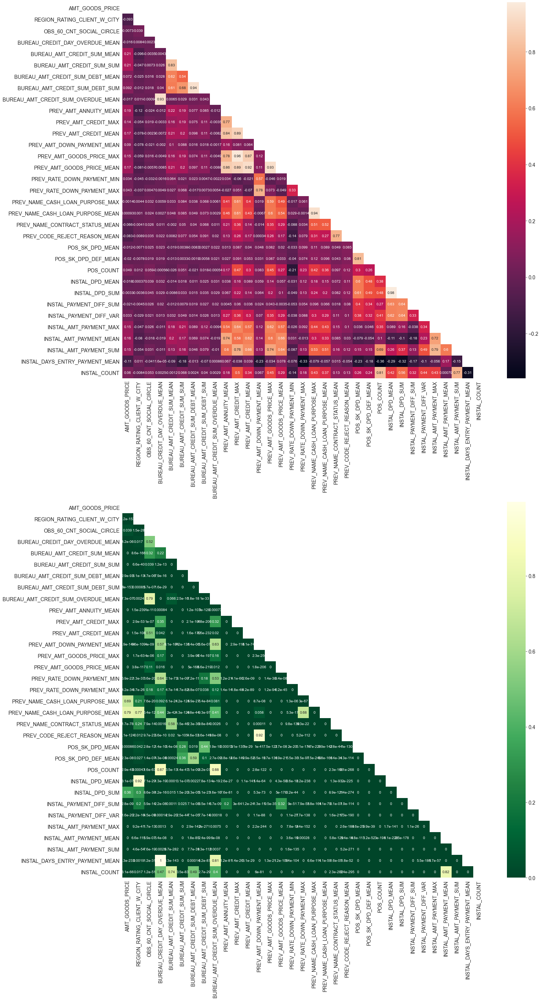

In [205]:
# Getting Spearman correlation on highly correlated variables only
spearman_correlation(data_train_cor[highly_correlated])

We will drop a good part of the correlated variables.

In [206]:
highly_correlated_to_drop = ["BUREAU_CREDIT_DAY_OVERDUE_MEAN",
                            "BUREAU_AMT_CREDIT_SUM_SUM",
                            "BUREAU_AMT_CREDIT_SUM_DEBT_SUM",
                            "PREV_AMT_CREDIT_MAX",
                            "PREV_AMT_CREDIT_MEAN",
                            "PREV_AMT_GOODS_PRICE_MAX",
                            "PREV_RATE_DOWN_PAYMENT_MIN",
                            "PREV_RATE_DOWN_PAYMENT_MAX",
                            "PREV_NAME_CASH_LOAN_PURPOSE_MAX",
                            "PREV_NAME_CONTRACT_STATUS_MEAN",
                            "POS_COUNT",
                            "INSTAL_COUNT",
                            "INSTAL_DPD_SUM",
                            "INSTAL_AMT_PAYMENT_MAX",
                            "INSTAL_AMT_PAYMENT_SUM",
                            "INSTAL_PAYMENT_DIFF_VAR",
                            "INSTAL_PAYMENT_DIFF_SUM",
                            "INSTAL_AMT_PAYMENT_MEAN",
                            "PREV_AMT_GOODS_PRICE_MEAN",
                            "BUREAU_AMT_CREDIT_SUM_MEAN",
                            "POS_SK_DPD_DEF_MEAN",
                            "INSTAL_DPD_MEAN"]

In [207]:
# Dropping correlated variables
data_train_cor.drop(highly_correlated_to_drop, axis=1, inplace=True)
new_highly_correlated = list(set(highly_correlated) - set(highly_correlated_to_drop))

Initial number of rows: 80725.
-----
Number of NaN values:
AMT_GOODS_PRICE                       0
PREV_CODE_REJECT_REASON_MEAN          0
PREV_NAME_CASH_LOAN_PURPOSE_MEAN      0
POS_SK_DPD_MEAN                       0
BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN    0
REGION_RATING_CLIENT_W_CITY           0
BUREAU_AMT_CREDIT_SUM_DEBT_MEAN       0
PREV_AMT_ANNUITY_MEAN                 0
PREV_AMT_DOWN_PAYMENT_MEAN            0
OBS_60_CNT_SOCIAL_CIRCLE              0
INSTAL_DAYS_ENTRY_PAYMENT_MEAN        0
dtype: int64.
-----
Removed 0 lines droping NaN.
Number of rows after droped NaN: 80725.


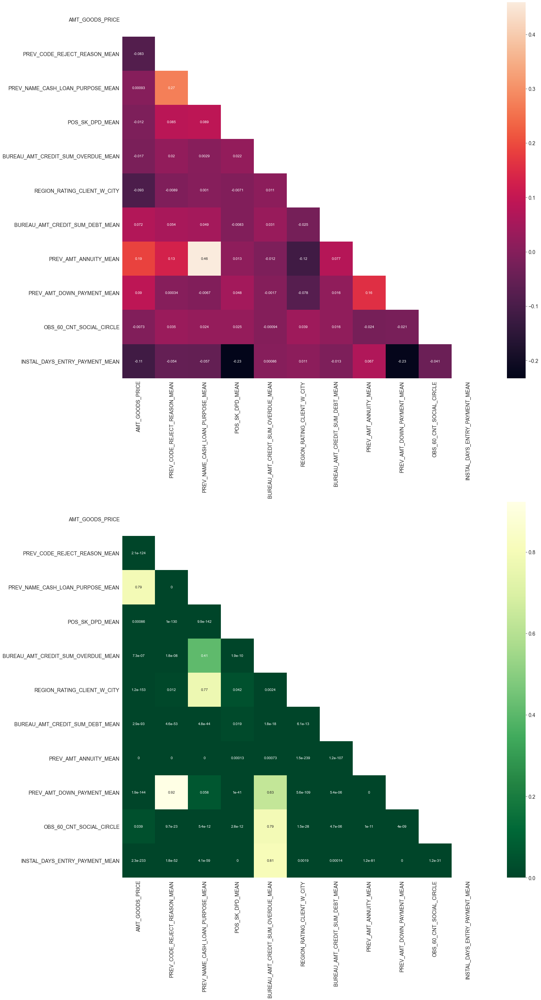

In [208]:
# Checking our remaining variables in the "highly correlated" group
spearman_correlation(data_train_cor[new_highly_correlated])

In [209]:
print(f"We have now {data_train_cor.shape[1]} numerical variables.")

We have now 126 numerical variables.


We make another run of variables selection on the moderately correlated variables.

In [210]:
highly_correlated, moderately_correlated, low_correlated = level_of_correlation(data_train_cor, 0.9, 0.7, 0.5)

There are 11 highly correlated variables, 47 moderately correlated, 40 low correlated.


Initial number of rows: 80725.
-----
Number of NaN values:
AMT_ANNUITY                          0
AMT_GOODS_PRICE                      0
CNT_FAM_MEMBERS                      0
LIVE_REGION_NOT_WORK_REGION          0
LIVE_CITY_NOT_WORK_CITY              0
DEF_60_CNT_SOCIAL_CIRCLE             0
INCOME_PER_PERSON                    0
BUREAU_DAYS_CREDIT_MEAN              0
BUREAU_DAYS_CREDIT_ENDDATE_MIN       0
BUREAU_DAYS_CREDIT_ENDDATE_MEAN      0
BUREAU_DAYS_CREDIT_UPDATE_MEAN       0
PREV_AMT_APPLICATION_MAX             0
PREV_AMT_APPLICATION_MEAN            0
PREV_AMT_CREDIT_MIN                  0
PREV_APP_CREDIT_PERC_MEAN            0
PREV_AMT_DOWN_PAYMENT_MAX            0
PREV_AMT_DOWN_PAYMENT_MEAN           0
PREV_AMT_GOODS_PRICE_MIN             0
PREV_HOUR_APPR_PROCESS_START_MEAN    0
PREV_RATE_DOWN_PAYMENT_MEAN          0
PREV_DAYS_DECISION_MEAN              0
PREV_CNT_PAYMENT_SUM                 0
PREV_NAME_CONTRACT_TYPE_MEAN         0
PREV_NAME_CASH_LOAN_PURPOSE_MEAN     0
PREV_

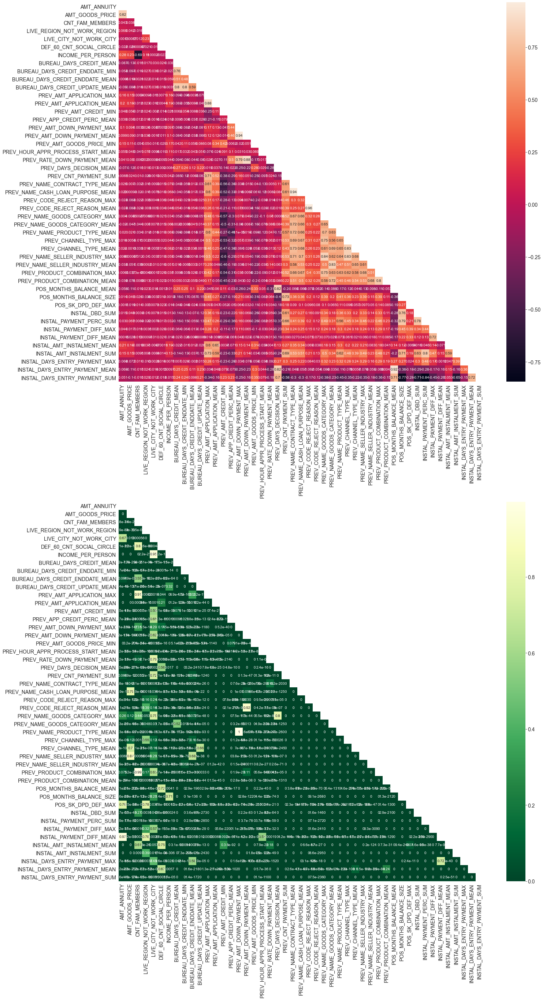

In [211]:
# Check "moderalety correlated" variables
spearman_correlation(data_train_cor[moderately_correlated])

In [212]:
# Dropping part of the moderately correlated variables
moderately_correlated_to_drop = ["PREV_AMT_APPLICATION_MAX",
                                "PREV_AMT_DOWN_PAYMENT_MAX",
                                "PREV_RATE_DOWN_PAYMENT_MEAN",
                                "PREV_DAYS_DECISION_MEAN",
                                "INSTAL_DAYS_ENTRY_PAYMENT_SUM",
                                "INSTAL_AMT_INSTALMENT_SUM",
                                "PREV_CODE_REJECT_REASON_MAX",
                                "PREV_NAME_GOODS_CATEGORY_MAX",
                                "PREV_CHANNEL_TYPE_MAX",
                                "PREV_NAME_SELLER_INDUSTRY_MAX",
                                "PREV_PRODUCT_COMBINATION_MAX",
                                "INSTAL_AMT_INSTALMENT_SUM",
                                "AMT_GOODS_PRICE",
                                "CNT_FAM_MEMBERS",
                                "POS_MONTHS_BALANCE_SIZE",
                                "PREV_NAME_CONTRACT_TYPE_MEAN",
                                "BUREAU_DAYS_CREDIT_ENDDATE_MIN",
                                "PREV_CHANNEL_TYPE_MEAN",
                                "INSTAL_PAYMENT_PERC_SUM",
                                "INSTAL_DAYS_ENTRY_PAYMENT_MEAN",
                                "PREV_NAME_SELLER_INDUSTRY_MEAN",
                                "BUREAU_DAYS_CREDIT_UPDATE_MEAN",
                                "PREV_NAME_PRODUCT_TYPE_MEAN",
                                "PREV_NAME_GOODS_CATEGORY_MEAN",
                                "PREV_CNT_PAYMENT_SUM",
                                "INSTAL_PAYMENT_DIFF_MAX",
                                "INSTAL_AMT_INSTALMENT_MEAN"]

In [213]:
# Dropping correlated variables
data_train_cor.drop(moderately_correlated_to_drop, axis=1, inplace=True)
new_moderately_correlated = list(set(moderately_correlated) - set(moderately_correlated_to_drop))

Initial number of rows: 80725.
-----
Number of NaN values:
PREV_AMT_GOODS_PRICE_MIN             0
PREV_PRODUCT_COMBINATION_MEAN        0
PREV_AMT_APPLICATION_MEAN            0
PREV_CODE_REJECT_REASON_MEAN         0
BUREAU_DAYS_CREDIT_MEAN              0
BUREAU_DAYS_CREDIT_ENDDATE_MEAN      0
INSTAL_DAYS_ENTRY_PAYMENT_MAX        0
PREV_NAME_CASH_LOAN_PURPOSE_MEAN     0
POS_SK_DPD_DEF_MAX                   0
PREV_AMT_DOWN_PAYMENT_MEAN           0
LIVE_REGION_NOT_WORK_REGION          0
AMT_ANNUITY                          0
LIVE_CITY_NOT_WORK_CITY              0
INSTAL_PAYMENT_DIFF_MEAN             0
DEF_60_CNT_SOCIAL_CIRCLE             0
POS_MONTHS_BALANCE_MEAN              0
INSTAL_DBD_SUM                       0
PREV_APP_CREDIT_PERC_MEAN            0
INCOME_PER_PERSON                    0
PREV_HOUR_APPR_PROCESS_START_MEAN    0
PREV_AMT_CREDIT_MIN                  0
dtype: int64.
-----
Removed 0 lines droping NaN.
Number of rows after droped NaN: 80725.


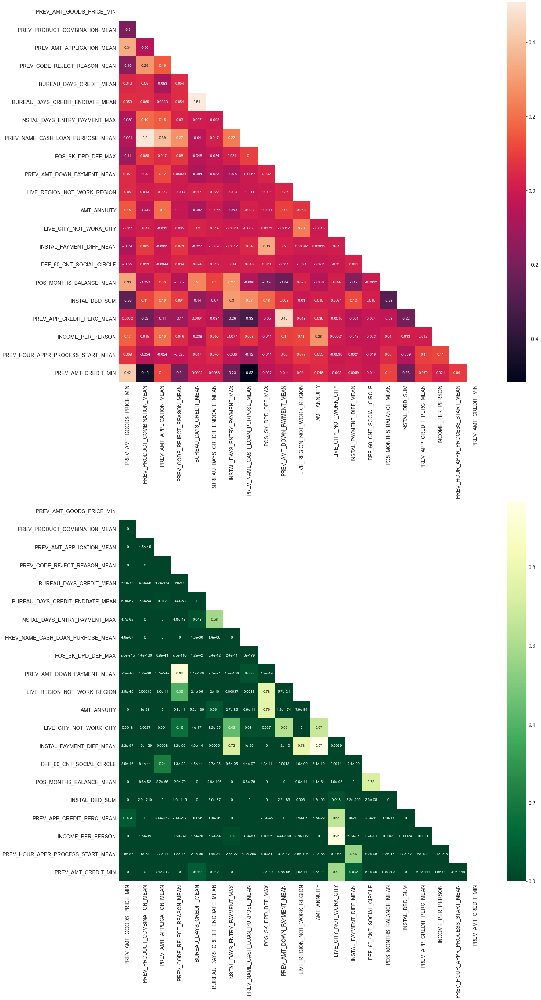

In [214]:
# Check "moderalety correlated" variables
spearman_correlation(data_train_cor[new_moderately_correlated])

Third and last run to clean the remaining correlated variables.

In [215]:
highly_correlated, moderately_correlated, low_correlated = level_of_correlation(data_train_cor, 0.9, 0.7, 0.5)

There are 6 highly correlated variables, 18 moderately correlated, 22 low correlated.


In [219]:
correlated = highly_correlated + moderately_correlated + low_correlated
correlated = list(set(correlated))

Initial number of rows: 80725.
-----
Number of NaN values:
PREV_CNT_PAYMENT_MEAN                 0
BUREAU_AMT_CREDIT_SUM_DEBT_MAX        0
BUREAU_CREDIT_ACTIVE_SUM              0
PREV_NAME_CONTRACT_TYPE_MAX           0
PREV_AMT_GOODS_PRICE_MIN              0
PREV_PRODUCT_COMBINATION_MEAN         0
BUREAU_AMT_CREDIT_SUM_DEBT_MEAN       0
PREV_AMT_ANNUITY_MEAN                 0
PREV_AMT_APPLICATION_MEAN             0
PREV_CODE_REJECT_REASON_MEAN          0
OBS_60_CNT_SOCIAL_CIRCLE              0
BUREAU_DAYS_CREDIT_MEAN               0
BUREAU_DAYS_CREDIT_ENDDATE_MEAN       0
ANNUITY_INCOME_PERC                   0
REGION_RATING_CLIENT_W_CITY           0
INSTAL_DAYS_ENTRY_PAYMENT_MAX         0
BUREAU_CREDIT_ACTIVE_MEAN             0
PREV_NAME_CASH_LOAN_PURPOSE_MEAN      0
POS_SK_DPD_DEF_MAX                    0
PREV_AMT_DOWN_PAYMENT_MEAN            0
LIVE_REGION_NOT_WORK_REGION           0
AMT_ANNUITY                           0
INSTAL_PAYMENT_PERC_VAR               0
LIVE_CITY_NOT_WORK_CI

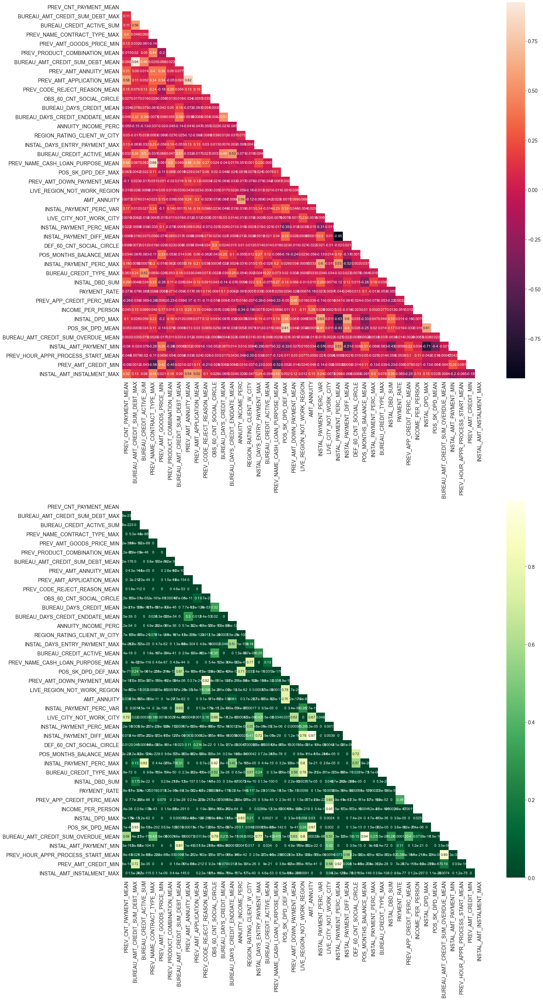

In [220]:
# Check "moderalety correlated" variables
spearman_correlation(data_train_cor[correlated])

In [221]:
correlated_to_drop = ["BUREAU_AMT_CREDIT_SUM_DEBT_MAX",
                    "PREV_AMT_APPLICATION_MEAN",
                    "BUREAU_AMT_CREDIT_SUM_DEBT_MAX",
                    "PREV_NAME_CONTRACT_TYPE_MAX",
                    "INSTAL_DPD_MAX",
                    "POS_SK_DPD_MEAN",
                    "INSTAL_PAYMENT_PERC_MEAN",
                    "INSTAL_PAYMENT_PERC_VAR"]

In [222]:
# Dropping correlated variables
data_train_cor.drop(correlated_to_drop, axis=1, inplace=True)
new_correlated = list(set(correlated) - set(correlated_to_drop))

Initial number of rows: 80725.
-----
Number of NaN values:
PREV_CNT_PAYMENT_MEAN                 0
BUREAU_CREDIT_ACTIVE_SUM              0
PREV_AMT_GOODS_PRICE_MIN              0
PREV_PRODUCT_COMBINATION_MEAN         0
BUREAU_AMT_CREDIT_SUM_DEBT_MEAN       0
PREV_AMT_ANNUITY_MEAN                 0
PREV_CODE_REJECT_REASON_MEAN          0
BUREAU_DAYS_CREDIT_MEAN               0
BUREAU_DAYS_CREDIT_ENDDATE_MEAN       0
ANNUITY_INCOME_PERC                   0
REGION_RATING_CLIENT_W_CITY           0
INSTAL_DAYS_ENTRY_PAYMENT_MAX         0
BUREAU_CREDIT_ACTIVE_MEAN             0
PREV_NAME_CASH_LOAN_PURPOSE_MEAN      0
POS_SK_DPD_DEF_MAX                    0
PREV_AMT_DOWN_PAYMENT_MEAN            0
LIVE_REGION_NOT_WORK_REGION           0
AMT_ANNUITY                           0
INSTAL_PAYMENT_PERC_VAR               0
LIVE_CITY_NOT_WORK_CITY               0
PREV_AMT_CREDIT_MIN                   0
INSTAL_PAYMENT_DIFF_MEAN              0
DEF_60_CNT_SOCIAL_CIRCLE              0
POS_MONTHS_BALANCE_ME

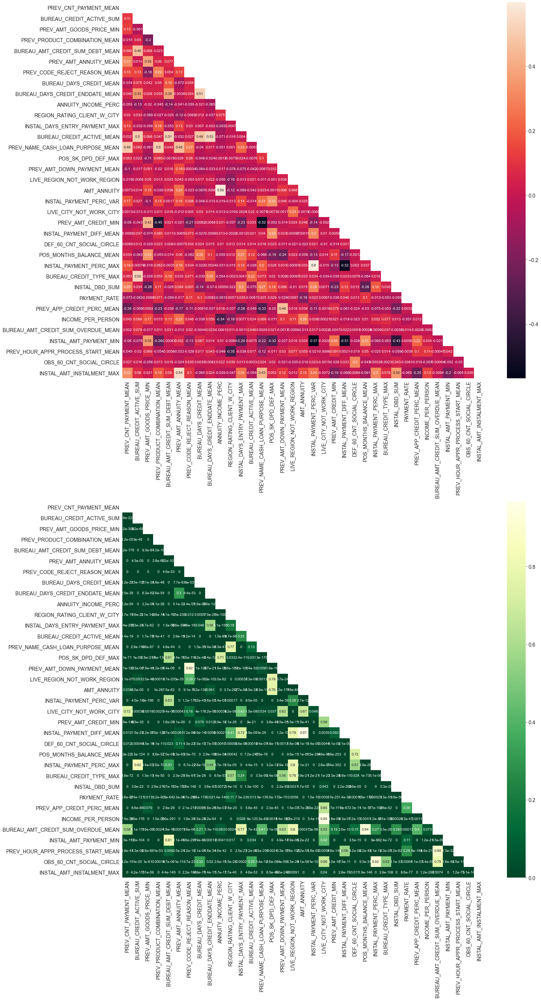

In [223]:
# Check last correlated variables
spearman_correlation(data_train_cor[new_correlated])

In [258]:
print(f"After cleaning correlated variables, we have {data_train_cor.shape[1]} numeric variables in our dataset.")

After cleaning correlated variables, we have 93 numeric variables in our dataset.


We cleaned most of correlated variables. We still have a few correlated variables with 0.5-0.6 correlation coefficient, but some may be important to determine default risk and have different signification. We will keep them.

## 10. PCA

We make a PCA to have insights into relationships between and see if it is worth using PCA axis as features in the modeling.

In [240]:
def cpa_custom(df, n_comp):
    """
    Drop NaN if any, scale data with Standard Scaler of scikit-learn and fit CPA.
    Return CPA object of scikit-learn and transformed data.
    """
    # Print info and drop NaN
    n_rows_initial = df.shape[0]
    print(f"Initial number of rows: {n_rows_initial}.\n-----")
    print(f"Number of NaN values:\n{df.isnull().sum()}.\n-----")
    df_clean=df.dropna()
    print(f"Removed {n_rows_initial - df_clean.shape[0]} lines droping NaN.")
    print(f"Number of rows after droped NaN: {df_clean.shape[0]}.")
    
    # Input data
    X = df_clean.values
    names = df_clean.index
    features = df_clean.columns
    
    # Scaling data
    std_scale = StandardScaler().fit(X)
    X_scaled = std_scale.transform(X)
    
    # Main axes calculation
    cpa = PCA(n_components=n_comp)
    cpa.fit(X_scaled)
    
    return cpa, X_scaled

In [260]:
acp, _ = cpa_custom(data_train_cor, 80)

Initial number of rows: 80725.
-----
Number of NaN values:
TARGET                                   0
CNT_CHILDREN                             0
AMT_INCOME_TOTAL                         0
AMT_CREDIT                               0
AMT_ANNUITY                              0
REGION_POPULATION_RELATIVE               0
DAYS_BIRTH                               0
DAYS_EMPLOYED                            0
DAYS_REGISTRATION                        0
DAYS_ID_PUBLISH                          0
REGION_RATING_CLIENT                     0
REGION_RATING_CLIENT_W_CITY              0
HOUR_APPR_PROCESS_START                  0
REG_REGION_NOT_LIVE_REGION               0
REG_REGION_NOT_WORK_REGION               0
LIVE_REGION_NOT_WORK_REGION              0
REG_CITY_NOT_LIVE_CITY                   0
REG_CITY_NOT_WORK_CITY                   0
LIVE_CITY_NOT_WORK_CITY                  0
EXT_SOURCE_1                             0
EXT_SOURCE_2                             0
EXT_SOURCE_3                          

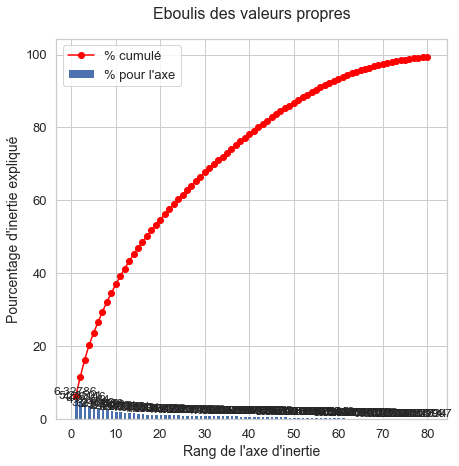

In [261]:
display_eigenvalues(acp, annotate=False)

In [246]:
print(f"The first main axis of PCA explains \
{round(np.cumsum(acp.explained_variance_ratio_ * 100)[0],2)} % of data variance.")
print(f"The first 4 main axis of PCA explain \
{round(np.cumsum(acp.explained_variance_ratio_ * 100)[3],2)} % of data variance.")
print(f"The first 6 main axis of PCA explain \
{round(np.cumsum(acp.explained_variance_ratio_ * 100)[5],2)} % of data variance.")

The first main axis of PCA explains 6.33 % of data variance.
The first 4 main axis of PCA explain 20.35 % of data variance.
The first 6 main axis of PCA explain 26.63 % of data variance.


We could get close to 95% of variance with about 70 PCA axis (out of 93 initial numeric variables). It would be interesting to reduce the number of features for modeling. However, we will loose a lot of explainability in the process. Since this model is to be used by insurers, it would be better to be able to relate decision making to real insurance-related variables (i.e. keeping a good explainability). The gain of 23 features is not enough to compensate for the need of this explainability.

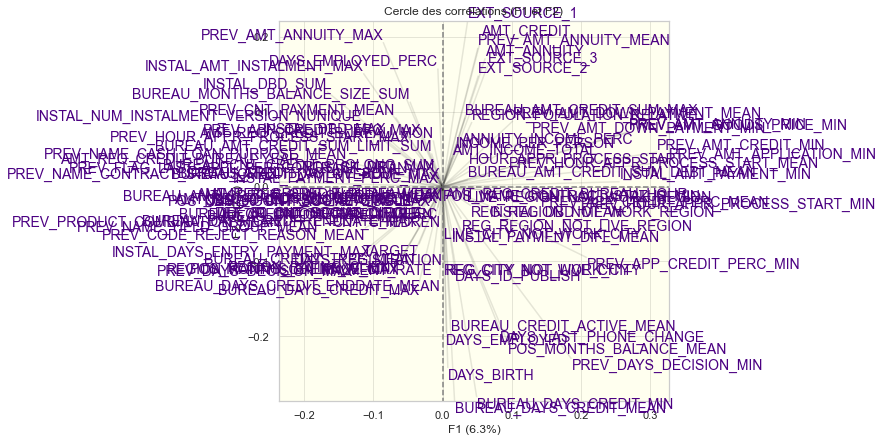

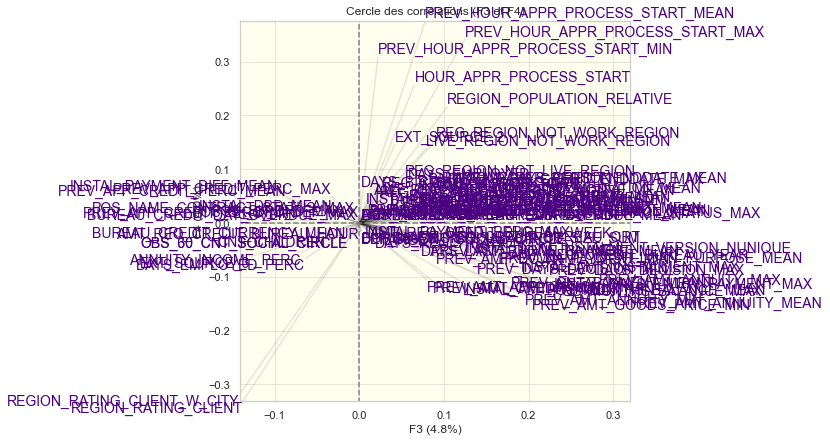

In [247]:
display_circles(acp, 4, [(0,1),(2,3)], labels=data_train_cor.columns)

## Final dataset

Now we concatenate with categorical and "flag" columns that we droped earlier for the correlation study.

In [ ]:
cat_col = data_train_clean.select_dtypes(include="object")
flags_col = data_train_clean[to_remove]

In [ ]:
# Concatenate all our features
data_train_clean_select = pd.concat([data_train_cor, cat_col], axis=1)
data_train_clean_select = pd.concat([data_train_clean_select, flags_col], axis=1)

In [239]:
# One categorical variable with low impact on credit default, we drop it
data_train_clean_select.drop("NAME_TYPE_SUITE", axis=1, inplace=True)

In [252]:
data_train_clean_select

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BUREAU_DAYS_CREDIT_MIN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_ENDDATE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_CREDIT_DAY_OVERDUE_MAX,BUREAU_AMT_CREDIT_SUM_MAX,BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN,BUREAU_AMT_CREDIT_SUM_LIMIT_SUM,BUREAU_CNT_CREDIT_PROLONG_SUM,BUREAU_MONTHS_BALANCE_SIZE_SUM,BUREAU_CREDIT_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_SUM,BUREAU_CREDIT_CURRENCY_MEAN,BUREAU_CREDIT_TYPE_MEAN,BUREAU_CREDIT_TYPE_MAX,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MIN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_CNT_PAYMENT_MEAN,PREV_FLAG_LAST_APPL_PER_CONTRACT_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_MEAN,PREV_NAME_CONTRACT_STATUS_MAX,PREV_CODE_REJECT_REASON_MEAN,PREV_NAME_YIELD_GROUP_MEAN,PREV_PRODUCT_COMBINATION_MEAN,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_NAME_CONTRACT_STATUS_MIN,POS_NAME_CONTRACT_STATUS_MAX,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_PAYMENT_MIN,INSTAL_DAYS_ENTRY_PAYMENT_MAX,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,SK_ID_CURR
0,1,0,202500.0000,406597.5000,24700.5000,0.0188,-9461,-637.0000,-3648.0000,-2120,2,2,10,0,0,0,0,0,0,0.0830,0.2629,0.1394,2.0000,2.0000,2.0000,2.0000,-1134.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0673,0.4980,202500.0000,0.1220,0.0607,-1437.0000,-103.0000,-874.0000,780.0000,-349.0000,0.0000,450000.0000,49156.2000,0.0000,31988.5650,0.0000,110.0000,0.2500,2.0000,2.0000,3.4605,3.7404,9251.7750,9251.7750,9251.7750,179055.0000,179055.0000,1.0000,1.0000,1.0000,0.0000,0.0000,179055.0000,9.0000,9.0000,9.0000,-606.0000,-606.0000,24.0000,0.0000,3.5883,0.0000,3.7975,1.0000,7.0030,-1.0000,-10.0000,0.0000,0.0000,0.0000,0.0000,2.0000,31.0000,20.4211,388.0000,1.0000,0.0000,53093.7450,9251.7750,-49.0000,Cash loans,M,N,Y,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100002
1,0,1,171000.0000,1560726.0000,41301.0000,0.0358,-13778,-3130.0000,-1213.0000,-619,2,2,16,0,0,0,0,0,0,0.7748,0.7240,0.4921,1.0000,0.0000,1.0000,0.0000,-1562.0000,0.0000,0.0000,0.0000,1.0000,1.0000,2.0000,0.2272,0.1096,57000.0000,0.2415,0.0265,-2882.0000,-2

## Export data for modelling

We have:
- `data_train_clean`: cleaned dataset (no `NaN`) with 187 variables (all variables from aggregation)
- `data_train_clean_select`: cleaned dataset (no `NaN`) with 131 variables, from which we dropped strongly correlated variables

We will use the later for export and modeling.

In [253]:
data_train_clean_select.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BUREAU_DAYS_CREDIT_MIN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_ENDDATE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_CREDIT_DAY_OVERDUE_MAX,BUREAU_AMT_CREDIT_SUM_MAX,BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN,BUREAU_AMT_CREDIT_SUM_LIMIT_SUM,BUREAU_CNT_CREDIT_PROLONG_SUM,BUREAU_MONTHS_BALANCE_SIZE_SUM,BUREAU_CREDIT_ACTIVE_MEAN,BUREAU_CREDIT_ACTIVE_SUM,BUREAU_CREDIT_CURRENCY_MEAN,BUREAU_CREDIT_TYPE_MEAN,BUREAU_CREDIT_TYPE_MAX,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MIN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_CNT_PAYMENT_MEAN,PREV_FLAG_LAST_APPL_PER_CONTRACT_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_MEAN,PREV_NAME_CONTRACT_STATUS_MAX,PREV_CODE_REJECT_REASON_MEAN,PREV_NAME_YIELD_GROUP_MEAN,PREV_PRODUCT_COMBINATION_MEAN,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_NAME_CONTRACT_STATUS_MIN,POS_NAME_CONTRACT_STATUS_MAX,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_PAYMENT_MIN,INSTAL_DAYS_ENTRY_PAYMENT_MAX,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,SK_ID_CURR
0,1,0,202500.0000,406597.5000,24700.5000,0.0188,-9461,-637.0000,-3648.0000,-2120,2,2,10,0,0,0,0,0,0,0.0830,0.2629,0.1394,2.0000,2.0000,2.0000,2.0000,-1134.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0673,0.4980,202500.0000,0.1220,0.0607,-1437.0000,-103.0000,-874.0000,780.0000,-349.0000,0.0000,450000.0000,49156.2000,0.0000,31988.5650,0.0000,110.0000,0.2500,2.0000,2.0000,3.4605,3.7404,9251.7750,9251.7750,9251.7750,179055.0000,179055.0000,1.0000,1.0000,1.0000,0.0000,0.0000,179055.0000,9.0000,9.0000,9.0000,-606.0000,-606.0000,24.0000,0.0000,3.5883,0.0000,3.7975,1.0000,7.0030,-1.0000,-10.0000,0.0000,0.0000,0.0000,0.0000,2.0000,31.0000,20.4211,388.0000,1.0000,0.0000,53093.7450,9251.7750,-49.0000,Cash loans,M,N,Y,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100002
1,0,1,171000.0000,1560726.0000,41301.0000,0.0358,-13778,-3130.0000,-1213.0000,-619,2,2,16,0,0,0,0,0,0,0.7748,0.7240,0.4921,1.0000,0.0000,1.0000,0.0000,-1562.0000,0.0000,0.0000,0.0000,1.0000,1.0000,2.0000,0.2272,0.1096,57000.0000,0.2415,0.0265,-2882.0000,-2

In [257]:
print(f"Our final dataset has {data_train_clean_select.shape[0]} rows and {data_train_clean_select.shape[1]} columns.")

Our final dataset has 80725 rows and 131 columns.


In [256]:
path_train_clean_select = os.path.join(path_to_csv, "data_train_clean_select.csv")
data_train_clean_select.to_csv(path_train_clean_select)

## Cost function

To better evaluate the models, we will build a cost function taking into account gains and losses (coefficients) multipled by the number of clients for each case of the confusion matrix.
The following gains and losses will be taken into account:

![table](./confusion_costs.png)

Our cost function will be the total revenue of a model such as:

R = (mean interests) * TN - (mean interests) * FP - (mean debt default loans + mean debt interests) * FN

In [164]:
# Calculate the % of credit not repaid after default
mean_debt = bureau["AMT_CREDIT_SUM_DEBT"].mean()
mean_credit = bureau["AMT_CREDIT_SUM"].mean()
perc_debt = mean_debt/mean_credit * 100
print(f"People are generally indebt of {perc_debt:.1f} % of their credit.")

People are generally indebt of 38.6 % of their credit.


In [194]:
# Calculate mean credit for clients making default ant the others
mean_credit_default = app_train[app_train["TARGET"]==1]["AMT_CREDIT"].mean()
mean_credit_repaid = app_train[app_train["TARGET"]==0]["AMT_CREDIT"].mean()
print(f"Mean credit of client who repay their loans: {mean_credit_repaid:.0f} $.")
print(f"Mean credit of client who make default: {mean_credit_default:.0f} $.")

Mean credit of client who repay their loans: 602648 $.
Mean credit of client who make default: 557779 $.


We can now calculate the mean loan debt in dollars.

In [195]:
mean_debt = perc_debt * mean_credit_default /100
print(f"Mean debt: {mean_debt:.0f} $.")

Mean debt: 215392 $.


Having a look at interests for repaid and default loans.

In [180]:
interest_primary_default = app_prev_train[app_prev_train["TARGET"]==1]["RATE_INTEREST_PRIMARY"].mean()
interest_primary_repaid = app_prev_train[app_prev_train["TARGET"]==0]["RATE_INTEREST_PRIMARY"].mean()

interest_privileged_default = app_prev_train[app_prev_train["TARGET"]==1]["RATE_INTEREST_PRIVILEGED"].mean()
interest_privileged_repaid = app_prev_train[app_prev_train["TARGET"]==0]["RATE_INTEREST_PRIVILEGED"].mean()

interests = pd.DataFrame({"Primary interests": [interest_primary_repaid, interest_primary_default],
                            "Privileged interests": [interest_privileged_repaid, interest_privileged_default]},
                            index=["0 (default)", "1 (repaid)"])
interests

,Primary interests,Privileged interests
0 (default),0.1895,0.7704
1 (repaid),0.1890,0.7810


There is a large difference between primary and privileged interests, but not significant between repaid and non repaid loan. We will use the mean interest rate of all categories and targets.

In [163]:
mean_interest = pd.concat([previous_app["RATE_INTEREST_PRIMARY"], previous_app["RATE_INTEREST_PRIVILEGED"]]).mean()
print(f"The mean interest rate is {mean_interest:.2f} %.")

The mean interest rate is 0.48 %.


We have all we need to calculate our coefficients.

In [196]:
# Interests for TN and TP
mean_interest_repaid = mean_interest * mean_credit_repaid / 100
mean_interest_default = mean_interest * mean_credit_default / 100

# Debts for FN
mean_debt_loan = perc_debt * mean_credit_default / 100
mean_debt_interest = perc_debt * mean_interest_default / 100
total_debt = mean_debt_loan + mean_debt_interest

In [197]:
print(f"Mean interest for repaid loans: {mean_interest_repaid:.0f} $.")
print(f"Mean total debt for default loans: {total_debt:.0f} $.")

Mean interest for repaid loans: 2898 $.
Mean total debt for default loans: 216428 $.


Our coefficients will therefore be:

![table](./confusion_costs_coefs.png)

With cost function such as:

R = TN * 2898 - FP * 2898 - FN * 216428